In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
#!unzip /content/gdrive/MyDrive/IMP/embedded_data-20210323T034408Z-001.zip -d /content/gdrive/MyDrive/IMP/e

In [3]:
import json
import numpy as np

In [4]:
import tensorflow as tf
tf.config.run_functions_eagerly(True)

In [5]:
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import Concatenate,LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization
from keras.optimizers import Adam, RMSprop
from keras.layers.wrappers import Bidirectional
from keras.layers.merge import add
from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing import image
from keras.models import Model
from keras import Input, layers
from keras import optimizers
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

In [6]:
filetry = '/content/gdrive/MyDrive/embedded_data/emd_im_name_feature.json'
with open(filetry) as train_file1:
    emd_im_name_feature = json.load(train_file1)
#for k,v in emd_im_name_feature.items():
#  print(k)
#  print((np.array(v)).shape)

import pickle


with open('/content/gdrive/MyDrive/btp_data/roi_dic_400.pkl', 'rb') as f:
    roi_dic_400 = pickle.load(f)
with open('/content/gdrive/MyDrive/btp_data/roi_dic_800.pkl', 'rb') as f:
    roi_dic_800 = pickle.load(f)
with open('/content/gdrive/MyDrive/btp_data/roi_dic_1200.pkl', 'rb') as f:
    roi_dic_1200 = pickle.load(f)
with open('/content/gdrive/MyDrive/btp_data/roi_dic_1609.pkl', 'rb') as f:
    roi_dic_1609 = pickle.load(f)

emd_im_name_feature={}

for k,v in roi_dic_400.items():
  emd_im_name_feature[k]=v
for k,v in roi_dic_800.items():
  emd_im_name_feature[k]=v
for k,v in roi_dic_1200.items():
  emd_im_name_feature[k]=v
for k,v in roi_dic_1609.items():
  emd_im_name_feature[k]=v
print(len(emd_im_name_feature))

In [7]:
filetry = '/content/gdrive/MyDrive/embedded_data/emd_im_name_article_list_tokenized.json'
with open(filetry) as train_file1:
    emd_im_name_article_list_tokenized = json.load(train_file1)
#for k,v in emd_im_name_article_list_tokenized.items():
#  print(k)
#  print((np.array(v)).shape)

In [8]:
filetry = '/content/gdrive/MyDrive/embedded_data/emd_im_name_caption_tokenized.json'
with open(filetry) as train_file1:
    emd_im_name_caption_tokenized = json.load(train_file1)
#for k,v in emd_im_name_caption_tokenized.items():
#  print(k)
#  print((np.array(v)).shape)

In [9]:
all_data=[]
for k,v in emd_im_name_feature.items():
  all_data.append(k)

In [10]:
array=[]
for i in range(1500):
  array.append(np.array(emd_im_name_article_list_tokenized[all_data[i]]))
X_article_train=np.stack(array, axis=0)
print(X_article_train.shape)

(1500, 40, 1024)


In [11]:
array=[]
for i in range(1500):
  npp=np.array(emd_im_name_caption_tokenized[all_data[i]])
  npp=npp.flatten()
  array.append(npp)
Y_caption_train=np.stack(array, axis=0)
print(Y_caption_train.shape)

(1500, 1024)


In [12]:
'''
array=[]
for i in range(1500):
  npp=np.array(emd_im_name_feature[all_data[i]])
  npp=npp.flatten()
  array.append(npp)

X_image_train=np.stack(array, axis=0)
print(X_image_train.shape)'''

'\narray=[]\nfor i in range(1500):\n  npp=np.array(emd_im_name_feature[all_data[i]])\n  npp=npp.flatten()\n  array.append(npp)\n\nX_image_train=np.stack(array, axis=0)\nprint(X_image_train.shape)'

In [13]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [14]:
class TransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super(TransformerBlock, self).__init__()
        self.att = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = keras.Sequential(
            [layers.Dense(ff_dim, activation="relu"), layers.Dense(embed_dim),]
        )
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(rate)
        self.dropout2 = layers.Dropout(rate)

    def call(self, inputs, training):
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)

In [15]:
class PositionEmbedding(layers.Layer):
    def __init__(self, maxlen, embed_dim):
        super(PositionEmbedding, self).__init__()
        self.pos_emb = layers.Embedding(input_dim=maxlen, output_dim=embed_dim)

    def call(self, x):
        positions = tf.range(start=0, limit=maxlen, delta=1)
        positions = self.pos_emb(positions)
        return x + positions

In [16]:
maxlen = 40  
embed_dim = 1024  # Embedding size for each token
num_heads = 2  # Number of attention heads
ff_dim = 32  # Hidden layer size in feed forward network inside transformer

In [17]:
#inputs = layers.Input(shape=(maxlen,))
#embedding_layer = TokenAndPositionEmbedding(maxlen, vocab_size, embed_dim)
#x = embedding_layer(inputs)
#transformer_block = TransformerBlock(embed_dim, num_heads, ff_dim)
#x = transformer_block(x)
#x = layers.GlobalAveragePooling1D()(x)
#x = layers.Dropout(0.1)(x)
#x = layers.Dense(20, activation="relu")(x)
#x = layers.Dropout(0.1)(x)
#outputs = layers.Dense(2, activation="softmax")(x)

#model = keras.Model(inputs=inputs, outputs=outputs)

Model

In [18]:
input1 = Input(shape=(40,1024)) #article
inp= Dropout(0.1)(input1)
ls_art = LSTM(1024)(inp)  #1024 article vector
#input2 = Input(shape=(75264,)) #image
#input22 = Dense(1024,activation='relu')(input2)
#con_cat = Concatenate()([ls_art, input22])
re= Reshape((1, 1024), input_shape=(1024,))(ls_art)
re1= Dropout(0.2)(re) #2048 vector (article +image ) features
#first

embedding_layer = PositionEmbedding(maxlen, embed_dim)
re11 = embedding_layer(re1)

transformer_block = TransformerBlock(embed_dim, num_heads, ff_dim)
ls =transformer_block(re11) #40*1024

flt=Flatten()(ls)
ls_2048 = Dense(1024,activation='relu')(flt)
re2= Reshape((1, 1024), input_shape=(1024,))(ls_2048)

#second

attn_out = tf.keras.layers.Attention()([re1,re2])
con2= Concatenate()([re2,attn_out])
ls_dense = Dense(1024,activation='relu')(con2)
ls1 = layers.GlobalAveragePooling1D()(ls_dense)
model = Model(inputs=input1, outputs=ls1)

In [19]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 40, 1024)]   0                                            
__________________________________________________________________________________________________
dropout (Dropout)               (None, 40, 1024)     0           input_1[0][0]                    
__________________________________________________________________________________________________
lstm (LSTM)                     (None, 1024)         8392704     dropout[0][0]                    
__________________________________________________________________________________________________
reshape (Reshape)               (None, 1, 1024)      0           lstm[0][0]                       
______________________________________________________________________________________________

In [20]:
opt = tf.keras.optimizers.SGD(learning_rate=0.1,momentum=0.7)

In [21]:
model.compile(loss='categorical_crossentropy', optimizer=opt)

In [22]:
model.fit(x=X_article_train,y=Y_caption_train,epochs=20)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/dataset_ops.py:3504: UserWarning: Even though the tf.config.experimental_run_functions_eagerly option is set, this option does not apply to tf.data functions. tf.data functions are still traced and executed as graphs.
  "Even though the tf.config.experimental_run_functions_eagerly "


Epoch 1/20
47/47 [==============================] - 35s 151ms/step - loss: 171.3930
Epoch 2/20
47/47 [==============================] - 7s 151ms/step - loss: 163.7985
Epoch 3/20
47/47 [==============================] - 7s 150ms/step - loss: 162.9012
Epoch 4/20
47/47 [==============================] - 7s 151ms/step - loss: 162.2411
Epoch 5/20
47/47 [==============================] - 7s 151ms/step - loss: 161.6281
Epoch 6/20
47/47 [==============================] - 7s 151ms/step - loss: 161.2193
Epoch 7/20
47/47 [==============================] - 7s 151ms/step - loss: 160.6109
Epoch 8/20
47/47 [==============================] - 7s 151ms/step - loss: 160.8499
Epoch 9/20
47/47 [==============================] - 7s 150ms/step - loss: 159.9749
Epoch 10/20
47/47 [==============================] - 7s 151ms/step - loss: 159.9788
Epoch 11/20
47/47 [==============================] - 7s 150ms/step - loss: 159.5902
Epoch 12/20
47/47 [==============================] - 7s 150ms/step - loss: 158.8917


Testing

In [23]:
#model.save_weights('/content/gdrive/MyDrive/btp_data/checkpoints/rcnn_wt')

In [24]:
#model.load_weights('/content/gdrive/MyDrive/btp_data/checkpoints/rcnn_wt')

In [25]:
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
from google.colab.patches import cv2_imshow

In [26]:
#!unzip /content/gdrive/MyDrive/IMP/btp_data-20210323T040838Z-001.zip -d /content/gdrive/MyDrive/IMP/b

In [27]:
filetry = '/content/gdrive/MyDrive/btp_data/im_name_article_list_1.json'
with open(filetry) as train_file1:
    article_list_real = json.load(train_file1)
filetry = '/content/gdrive/MyDrive/btp_data/im_name_caption.json'
with open(filetry) as train_file1:
    caption_real = json.load(train_file1)

In [28]:
filetry = '/content/gdrive/MyDrive/btp_data/im_name_capno_50_final.json'
with open(filetry) as train_file1:
    img_cap_real = json.load(train_file1)

In [29]:
array=[]
for i in range(1500,1609):
  array.append(np.array(emd_im_name_article_list_tokenized[all_data[i]]))
X_article_test=np.stack(array, axis=0)
print(X_article_test.shape)

(109, 40, 1024)


In [30]:
array=[]
for i in range(1500,1609):
  npp=np.array(emd_im_name_feature[all_data[i]])
  npp=npp.flatten()
  array.append(npp)

X_image_test=np.stack(array, axis=0)
print(X_image_test.shape)

(109, 1024)


In [31]:
output=model.predict(X_article_test)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/dataset_ops.py:3504: UserWarning: Even though the tf.config.experimental_run_functions_eagerly option is set, this option does not apply to tf.data functions. tf.data functions are still traced and executed as graphs.
  "Even though the tf.config.experimental_run_functions_eagerly "


In [32]:
!pip install -U spacy
!python -m spacy download en_core_web_sm
import spacy
nlp = spacy.load("en_core_web_sm")

     |████████████████████████████████| 12.8MB 220kB/s 
     |████████████████████████████████| 460kB 38.8MB/s 
     |████████████████████████████████| 9.1MB 37.5MB/s 
     |████████████████████████████████| 51kB 7.2MB/s 
     |████████████████████████████████| 1.1MB 32.3MB/s 
     |████████████████████████████████| 122kB 22.1MB/s 
  Created wheel for smart-open: filename=smart_open-3.0.0-cp37-none-any.whl size=107098 sha256=5eae296b8b185062904c5f2174e4f6287add9239985d3e05ff970c5ced10d159
  Stored in directory: /root/.cache/pip/wheels/18/88/7c/f06dabd5e9cabe02d2269167bcacbbf9b47d0c0ff7d6ebcb78
Successfully built smart-open
  Found existing installation: catalogue 1.0.0
    Uninstalling catalogue-1.0.0:
      Successfully uninstalled catalogue-1.0.0
  Found existing installation: srsly 1.0.5
    Uninstalling srsly-1.0.5:
      Successfully uninstalled srsly-1.0.5
  Found existing installation: smart-open 5.0.0
    Uninstalling smart-open-5.0.0:
      Successfully uninstalled smart-open-

In [33]:
import cv2

from nltk.translate.bleu_score import sentence_bleu


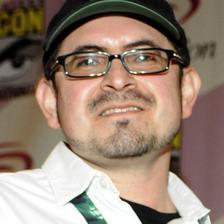

None
Caption:
"I've been telling people my story for years," wrote Molly McIsaac, a publicist and writer, who tweeted that Mr. Berganza had groped her.
True val
Eddie Berganza, a comics editor, was fired from DC Entertainment on Monday, the company said.



['Eddie', 'Berganza,', 'a', 'comics', 'editor,', 'was', 'fired', 'from', 'DC', 'Entertainment', 'on', 'Monday,', 'the', 'company', 'said.']
['"I\'ve', 'been', 'telling', 'people', 'my', 'story', 'for', 'years,"', 'wrote', 'Molly', 'McIsaac,', 'a', 'publicist', 'and', 'writer,', 'who', 'tweeted', 'that', 'Mr.', 'Berganza', 'had', 'groped', 'her.']
0.4566337854967312
0.5


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


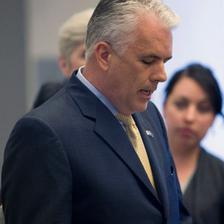

None
Caption:
Humiliated, and struggling to make a living, Mr. Hampton threatened to make the affair public.
True val

Senator John Ensign, Republican of Nevada, announcing Thursday that he was leaving after a decade in the Senate.





['Senator', 'John', 'Ensign,', 'Republican', 'of', 'Nevada,', 'announcing', 'Thursday', 'that', 'he', 'was', 'leaving', 'after', 'a', 'decade', 'in', 'the', 'Senate.']
['Humiliated,', 'and', 'struggling', 'to', 'make', 'a', 'living,', 'Mr.', 'Hampton', 'threatened', 'to', 'make', 'the', 'affair', 'public.']
0.5081327481546147
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


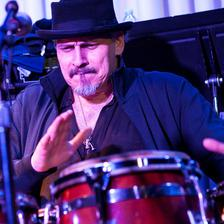

None
Caption:
In recent years he has worked extensively with flamenco musicians, as a byproduct of his nearly decade-long residency in Madrid.
True val

Jerry Gonzalez & the Fort Apache Band Mr. Gonzalez, a conguero, leading the group at the Blue Note.





['Jerry', 'Gonzalez', '&', 'the', 'Fort', 'Apache', 'Band', 'Mr.', 'Gonzalez,', 'a', 'conguero,', 'leading', 'the', 'group', 'at', 'the', 'Blue', 'Note.']
['In', 'recent', 'years', 'he', 'has', 'worked', 'extensively', 'with', 'flamenco', 'musicians,', 'as', 'a', 'byproduct', 'of', 'his', 'nearly', 'decade-long', 'residency', 'in', 'Madrid.']
0.4728708045015879
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


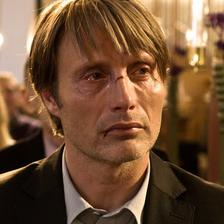

None
Caption:
Mr. Mikkelsen said that he wanted to share his award with everyone who had worked on the film, including Mr. Vinterberg, whose far superior movie "The Celebration" shared the Jury Prize here in 1998.
True val

Mads Mikkelsen, in “The Hunt,” won best actor at Cannes.





['Mads', 'Mikkelsen,', 'in', '“The', 'Hunt,”', 'won', 'best', 'actor', 'at', 'Cannes.']
['Mr.', 'Mikkelsen', 'said', 'that', 'he', 'wanted', 'to', 'share', 'his', 'award', 'with', 'everyone', 'who', 'had', 'worked', 'on', 'the', 'film,', 'including', 'Mr.', 'Vinterberg,', 'whose', 'far', 'superior', 'movie', '"The', 'Celebration"', 'shared', 'the', 'Jury', 'Prize', 'here', 'in', '1998.']
0
0.3333333333333333


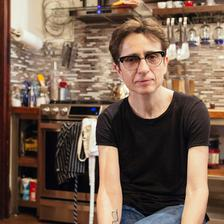

None
Caption:
"Absolute homelessness is unbearable," writes Leszek Kolakowski, a Polish philosopher living in London.
True val
Masha Gessen



['Masha', 'Gessen']
['"Absolute', 'homelessness', 'is', 'unbearable,"', 'writes', 'Leszek', 'Kolakowski,', 'a', 'Polish', 'philosopher', 'living', 'in', 'London.']
0.5266403878479265
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


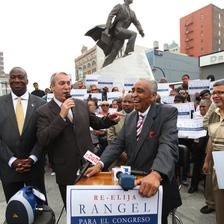

None
Caption:
Mr. Rangel, 81, who has been in Congress since 1971, is trying to signal to donors, the news media and the city's political class that despite health issues and ethics concerns he is still going strong; Mr. Espaillat, in turn, is trying to show that Mr. Rangel has lost influential support.
True val

 Representative Charles Rangel was endorsed by Adam Clayton Powell IV.





['Representative', 'Charles', 'Rangel', 'was', 'endorsed', 'by', 'Adam', 'Clayton', 'Powell', 'IV.']
['Mr.', 'Rangel,', '81,', 'who', 'has', 'been', 'in', 'Congress', 'since', '1971,', 'is', 'trying', 'to', 'signal', 'to', 'donors,', 'the', 'news', 'media', 'and', 'the', "city's", 'political', 'class', 'that', 'despite', 'health', 'issues', 'and', 'ethics', 'concerns', 'he', 'is', 'still', 'going', 'strong;', 'Mr.', 'Espaillat,', 'in', 'turn,', 'is', 'trying', 'to', 'show', 'that', 'Mr.', 'Rangel', 'has', 'lost', 'influential', 'support.']
0
0.5


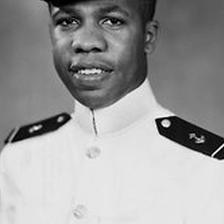

None
Caption:
He was ranked 370th in a class of 790.
True val

Wesley A. Brown in 1949.





['Wesley', 'A.', 'Brown', 'in', '1949.']
['He', 'was', 'ranked', '370th', 'in', 'a', 'class', 'of', '790.']
0
0.0


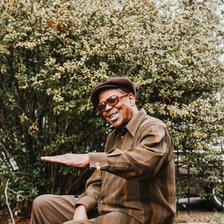

None
Caption:
In this frenzy, Hayes, a staff writer and producer -- who, along with his songwriting partner David Porter had generated hit records for Sam & Dave ("Soul Man") and Carla Thomas ("B-A-B-Y") -- was given a green light to record a solo album with complete creative control.
True val
Harold Beane, who played the guitar solo on Hayes’s cover of “Walk on By,” at his home in Memphis.



['Harold', 'Beane,', 'who', 'played', 'the', 'guitar', 'solo', 'on', 'Hayes’s', 'cover', 'of', '“Walk', 'on', 'By,”', 'at', 'his', 'home', 'in', 'Memphis.']
['In', 'this', 'frenzy,', 'Hayes,', 'a', 'staff', 'writer', 'and', 'producer', '--', 'who,', 'along', 'with', 'his', 'songwriting', 'partner', 'David', 'Porter', 'had', 'generated', 'hit', 'records', 'for', 'Sam', '&', 'Dave', '("Soul', 'Man")', 'and', 'Carla', 'Thomas', '("B-A-B-Y")', '--', 'was', 'given', 'a', 'green', 'light', 'to', 'record', 'a', 'solo', 'album', 'with', 'complete', 'creative', 'control.']
0.3819227559309534
0.2


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


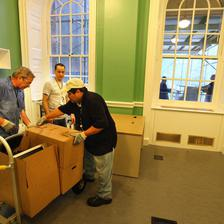

None
Caption:
An overflow space, Room 4A, sits directly below and will include desks for online outlets like Capital New York and DNAinfo.com.
True val

Workers from the Department of Citywide Administrative Services moved a desk for The New York Post back to Room 9.





['Workers', 'from', 'the', 'Department', 'of', 'Citywide', 'Administrative', 'Services', 'moved', 'a', 'desk', 'for', 'The', 'New', 'York', 'Post', 'back', 'to', 'Room', '9.']
['An', 'overflow', 'space,', 'Room', '4A,', 'sits', 'directly', 'below', 'and', 'will', 'include', 'desks', 'for', 'online', 'outlets', 'like', 'Capital', 'New', 'York', 'and', 'DNAinfo.com.']
0
0.0


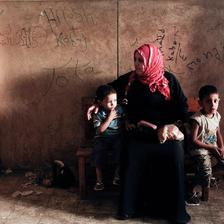

None
Caption:
While each of the campaigns denied the charges, voters everywhere were eager to vent their fears that the wrong candidate might win -- usually pointing to either Mr. Morsi or Mr. Shafik.
True val

A woman waited to vote in Cairo on Thursday, the second day of balloting. A liberal Islamist and two former government officials were also still in the running.





['A', 'woman', 'waited', 'to', 'vote', 'in', 'Cairo', 'on', 'Thursday,', 'the', 'second', 'day', 'of', 'balloting.', 'A', 'liberal', 'Islamist', 'and', 'two', 'former', 'government', 'officials', 'were', 'also', 'still', 'in', 'the', 'running.']
['While', 'each', 'of', 'the', 'campaigns', 'denied', 'the', 'charges,', 'voters', 'everywhere', 'were', 'eager', 'to', 'vent', 'their', 'fears', 'that', 'the', 'wrong', 'candidate', 'might', 'win', '--', 'usually', 'pointing', 'to', 'either', 'Mr.', 'Morsi', 'or', 'Mr.', 'Shafik.']
0
0.0


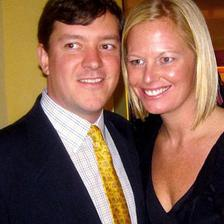

None
Caption:
The bridegroom's mother retired as an aide to the supervisor for Southern Marin County in San Rafael, Calif. She is the author of "When Learning Is Tough: Kids Talk About Their Learning Disabilities."
True val

Deck Higgins




['Deck', 'Higgins']
['The', "bridegroom's", 'mother', 'retired', 'as', 'an', 'aide', 'to', 'the', 'supervisor', 'for', 'Southern', 'Marin', 'County', 'in', 'San', 'Rafael,', 'Calif.', 'She', 'is', 'the', 'author', 'of', '"When', 'Learning', 'Is', 'Tough:', 'Kids', 'Talk', 'About', 'Their', 'Learning', 'Disabilities."']
0
0.0


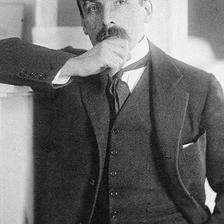

None
Caption:
Those included Germany's retaining possession of Alsace and Lorraine, a position that had Kessler's full-throated endorsement.
True val

Harry Kessler





['Harry', 'Kessler']
['Those', 'included', "Germany's", 'retaining', 'possession', 'of', 'Alsace', 'and', 'Lorraine,', 'a', 'position', 'that', 'had', "Kessler's", 'full-throated', 'endorsement.']
0.5
0.3333333333333333


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


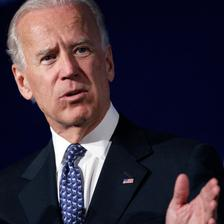

None
Caption:
Mr. Biden, a 69-year-old Roman Catholic, seemed to acknowledge in his interview that he was diverging from the president's stated position.
True val

Vice President Joseph R. Biden Jr., shown in March, said on NBC on Sunday that he was “absolutely comfortable” with same-sex marriages and spoke of meeting a gay couple with children.





['Vice', 'President', 'Joseph', 'R.', 'Biden', 'Jr.,', 'shown', 'in', 'March,', 'said', 'on', 'NBC', 'on', 'Sunday', 'that', 'he', 'was', '“absolutely', 'comfortable”', 'with', 'same-sex', 'marriages', 'and', 'spoke', 'of', 'meeting', 'a', 'gay', 'couple', 'with', 'children.']
['Mr.', 'Biden,', 'a', '69-year-old', 'Roman', 'Catholic,', 'seemed', 'to', 'acknowledge', 'in', 'his', 'interview', 'that', 'he', 'was', 'diverging', 'from', 'the', "president's", 'stated', 'position.']
0.4671379777282001
0.5


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


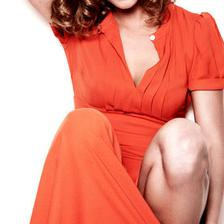

None
Caption:
I just flew in from Madrid, and I hate flying.
True val

Natalia Tena





['Natalia', 'Tena']
['I', 'just', 'flew', 'in', 'from', 'Madrid,', 'and', 'I', 'hate', 'flying.']
0
0.0


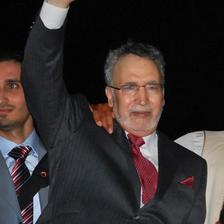

None
Caption:
He spoke with sadness about Mr. Megrahi's death, saying he had met him for the last time in December, when Mr. Megrahi was bedbound and in great pain.
True val

Abdel Baset al-Megrahi in 2009.





['Abdel', 'Baset', 'al-Megrahi', 'in', '2009.']
['He', 'spoke', 'with', 'sadness', 'about', 'Mr.', "Megrahi's", 'death,', 'saying', 'he', 'had', 'met', 'him', 'for', 'the', 'last', 'time', 'in', 'December,', 'when', 'Mr.', 'Megrahi', 'was', 'bedbound', 'and', 'in', 'great', 'pain.']
0
1.0


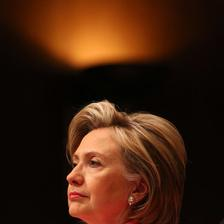

None
Caption:
Because the State Department was one of nine United States government agencies that signed off on the deal, questions have been raised about whether there were any connections between deal's approval and the donations to the Clinton Foundation.
True val
Hillary Clinton, then secretary of state, during a Senate Foreign Relations Committee hearing in May 2010.



['Hillary', 'Clinton,', 'then', 'secretary', 'of', 'state,', 'during', 'a', 'Senate', 'Foreign', 'Relations', 'Committee', 'hearing', 'in', 'May', '2010.']
['Because', 'the', 'State', 'Department', 'was', 'one', 'of', 'nine', 'United', 'States', 'government', 'agencies', 'that', 'signed', 'off', 'on', 'the', 'deal,', 'questions', 'have', 'been', 'raised', 'about', 'whether', 'there', 'were', 'any', 'connections', 'between', "deal's", 'approval', 'and', 'the', 'donations', 'to', 'the', 'Clinton', 'Foundation.']
0
0.0


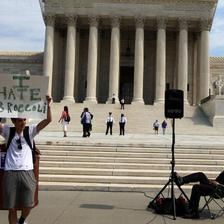

None
Caption:
While that work was not completed in time to assess the current tax proposal, new estimates should be ready soon.
True val
No one likes being forced to eat broccoli, or buy health insurance. But vegetables are still part of a healthy diet.



['No', 'one', 'likes', 'being', 'forced', 'to', 'eat', 'broccoli,', 'or', 'buy', 'health', 'insurance.', 'But', 'vegetables', 'are', 'still', 'part', 'of', 'a', 'healthy', 'diet.']
['While', 'that', 'work', 'was', 'not', 'completed', 'in', 'time', 'to', 'assess', 'the', 'current', 'tax', 'proposal,', 'new', 'estimates', 'should', 'be', 'ready', 'soon.']
0


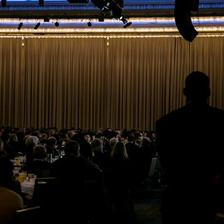

None
Caption:
Jay Kriegel, a senior adviser at the Related Companies, a real estate firm, praised Mr. de Blasio's emphasis on the tax proposal.
True val
Mayor Bill de Blasio has used appearances before the Association for a Better New York to unveil several major initiatives. But on Monday, he mostly reviewed his first term and spoke of the threat from the Trump administration.



['Mayor', 'Bill', 'de', 'Blasio', 'has', 'used', 'appearances', 'before', 'the', 'Association', 'for', 'a', 'Better', 'New', 'York', 'to', 'unveil', 'several', 'major', 'initiatives.', 'But', 'on', 'Monday,', 'he', 'mostly', 'reviewed', 'his', 'first', 'term', 'and', 'spoke', 'of', 'the', 'threat', 'from', 'the', 'Trump', 'administration.']
['Jay', 'Kriegel,', 'a', 'senior', 'adviser', 'at', 'the', 'Related', 'Companies,', 'a', 'real', 'estate', 'firm,', 'praised', 'Mr.', 'de', "Blasio's", 'emphasis', 'on', 'the', 'tax', 'proposal.']
0.5491004867761125
0.3333333333333333


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


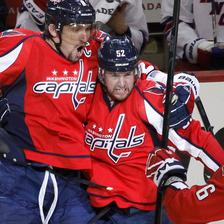

None
Caption:
Rangers defenseman Marc Staal said the other Washington power play in the first period put the Rangers on their "heels a little bit."
True val

Washington’s Mike Green, center, after his third-period goal. Green scored only three times in the regular season.





['Washington’s', 'Mike', 'Green,', 'center,', 'after', 'his', 'third-period', 'goal.', 'Green', 'scored', 'only', 'three', 'times', 'in', 'the', 'regular', 'season.']
['Rangers', 'defenseman', 'Marc', 'Staal', 'said', 'the', 'other', 'Washington', 'power', 'play', 'in', 'the', 'first', 'period', 'put', 'the', 'Rangers', 'on', 'their', '"heels', 'a', 'little', 'bit."']
0.4566337854967312
0.3333333333333333


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


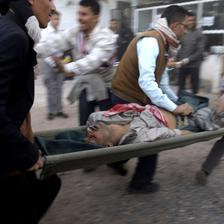

None
Caption:
The article noted that Mr. Feierstein made his remarks just before the violence started.
True val

Yemeni protesters aided a wounded man on Saturday after security forces opened fire on them in Sana, the nation's capital.





['Yemeni', 'protesters', 'aided', 'a', 'wounded', 'man', 'on', 'Saturday', 'after', 'security', 'forces', 'opened', 'fire', 'on', 'them', 'in', 'Sana,', 'the', "nation's", 'capital.']
['The', 'article', 'noted', 'that', 'Mr.', 'Feierstein', 'made', 'his', 'remarks', 'just', 'before', 'the', 'violence', 'started.']
0
0.0


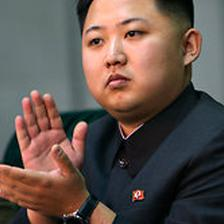

None
Caption:
Analysts said the move by the son -- or by whoever might be choreographing his succession -- to first be installed as head of the military reflected the importance of its allegiance.
True val

A newspaper urged Kim Jong-un to become “supreme commander” of the military.





['A', 'newspaper', 'urged', 'Kim', 'Jong-un', 'to', 'become', '“supreme', 'commander”', 'of', 'the', 'military.']
['Analysts', 'said', 'the', 'move', 'by', 'the', 'son', '--', 'or', 'by', 'whoever', 'might', 'be', 'choreographing', 'his', 'succession', '--', 'to', 'first', 'be', 'installed', 'as', 'head', 'of', 'the', 'military', 'reflected', 'the', 'importance', 'of', 'its', 'allegiance.']
0
0.0


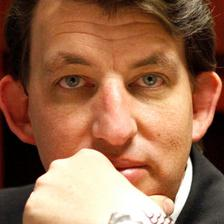

None
Caption:
In state capitols, the debates have been reframed in the dry language of good government -- a simple effort to clear the air, supporters say, for confused voters.
True val

State Representative Carl Seel wrote an Arizona measure.





['State', 'Representative', 'Carl', 'Seel', 'wrote', 'an', 'Arizona', 'measure.']
['In', 'state', 'capitols,', 'the', 'debates', 'have', 'been', 'reframed', 'in', 'the', 'dry', 'language', 'of', 'good', 'government', '--', 'a', 'simple', 'effort', 'to', 'clear', 'the', 'air,', 'supporters', 'say,', 'for', 'confused', 'voters.']
0.4347208719449914


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


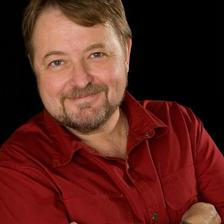

None
Caption:
Although Urrea has stitched a seamless end to the saga initiated in "The Hummingbird's Daughter," "Queen of America" lacks the clarity of vision of its prequel.
True val

Luis Alberto Urrea





['Luis', 'Alberto', 'Urrea']
['Although', 'Urrea', 'has', 'stitched', 'a', 'seamless', 'end', 'to', 'the', 'saga', 'initiated', 'in', '"The', "Hummingbird's", 'Daughter,"', '"Queen', 'of', 'America"', 'lacks', 'the', 'clarity', 'of', 'vision', 'of', 'its', 'prequel.']
0.4428500142691474
0.3333333333333333


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


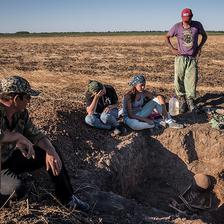

None
Caption:
Since the war, the city has been completely rebuilt, and in 1961 was renamed Volgograd, an effort to erase Stalin's legacy.
True val

A member of the search team suggested that this soldier may have been buried in the spot where he died.





['A', 'member', 'of', 'the', 'search', 'team', 'suggested', 'that', 'this', 'soldier', 'may', 'have', 'been', 'buried', 'in', 'the', 'spot', 'where', 'he', 'died.']
['Since', 'the', 'war,', 'the', 'city', 'has', 'been', 'completely', 'rebuilt,', 'and', 'in', '1961', 'was', 'renamed', 'Volgograd,', 'an', 'effort', 'to', 'erase', "Stalin's", 'legacy.']
0
0.0


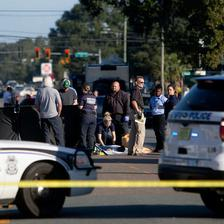

None
Caption:
It has generated several leads, but nothing that has cracked the case.
True val
Officials investigated a shooting on Tuesday in Tampa, Fla., that the police believe may have been the work of a serial killer.



['Officials', 'investigated', 'a', 'shooting', 'on', 'Tuesday', 'in', 'Tampa,', 'Fla.,', 'that', 'the', 'police', 'believe', 'may', 'have', 'been', 'the', 'work', 'of', 'a', 'serial', 'killer.']
['It', 'has', 'generated', 'several', 'leads,', 'but', 'nothing', 'that', 'has', 'cracked', 'the', 'case.']
0


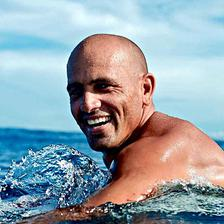

None
Caption:
The swells start out in the Atlantic and drag pretty far before they get to the coast, losing a lot of their energy and speed.
True val

Mr. Slater.





['Mr.', 'Slater.']
['The', 'swells', 'start', 'out', 'in', 'the', 'Atlantic', 'and', 'drag', 'pretty', 'far', 'before', 'they', 'get', 'to', 'the', 'coast,', 'losing', 'a', 'lot', 'of', 'their', 'energy', 'and', 'speed.']
0.447213595499958
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


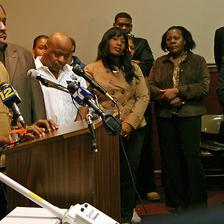

None
Caption:
But the willingness is there.
True val

Jean Elie Porchette, left, helped form a Haitian relief team from Spring Valley. Hasidic Jews there donated money and items like the phone at left.





['Jean', 'Elie', 'Porchette,', 'left,', 'helped', 'form', 'a', 'Haitian', 'relief', 'team', 'from', 'Spring', 'Valley.', 'Hasidic', 'Jews', 'there', 'donated', 'money', 'and', 'items', 'like', 'the', 'phone', 'at', 'left.']
['But', 'the', 'willingness', 'is', 'there.']
0


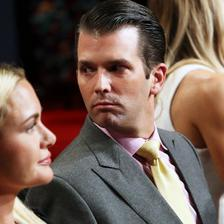

None
Caption:
The correspondence, which began weeks before the Nov. 8, 2016, election and continued through much of this year, is the second time it has been publicly revealed that Mr. Trump communicated with people and organizations with ties to the Russian government who were trying to undermine the presidential campaign of Hillary Clinton.
True val
Donald Trump Jr. at the third presidential debate last year.



['Donald', 'Trump', 'Jr.', 'at', 'the', 'third', 'presidential', 'debate', 'last', 'year.']
['The', 'correspondence,', 'which', 'began', 'weeks', 'before', 'the', 'Nov.', '8,', '2016,', 'election', 'and', 'continued', 'through', 'much', 'of', 'this', 'year,', 'is', 'the', 'second', 'time', 'it', 'has', 'been', 'publicly', 'revealed', 'that', 'Mr.', 'Trump', 'communicated', 'with', 'people', 'and', 'organizations', 'with', 'ties', 'to', 'the', 'Russian', 'government', 'who', 'were', 'trying', 'to', 'undermine', 'the', 'presidential', 'campaign', 'of', 'Hillary', 'Clinton.']
0


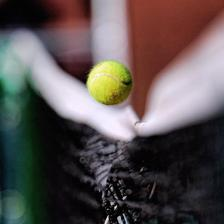

None
Caption:
The nets at United States Open are quite tight while Wimbledon's nets, stuck in the grass, are looser.
True val

Little is known about the origin of the “let serve” rule.





['Little', 'is', 'known', 'about', 'the', 'origin', 'of', 'the', '“let', 'serve”', 'rule.']
['The', 'nets', 'at', 'United', 'States', 'Open', 'are', 'quite', 'tight', 'while', "Wimbledon's", 'nets,', 'stuck', 'in', 'the', 'grass,', 'are', 'looser.']
0
0.0


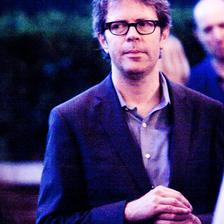

None
Caption:
The nonfiction of pre-eminent novelists is bound to fascinate, shedding light on their mentality and fictional practice, even if such authors seem to be giving less than full energy to this second-choice genre.
True val

Jonathan Franzen





['Jonathan', 'Franzen']
['The', 'nonfiction', 'of', 'pre-eminent', 'novelists', 'is', 'bound', 'to', 'fascinate,', 'shedding', 'light', 'on', 'their', 'mentality', 'and', 'fictional', 'practice,', 'even', 'if', 'such', 'authors', 'seem', 'to', 'be', 'giving', 'less', 'than', 'full', 'energy', 'to', 'this', 'second-choice', 'genre.']
0
0.0


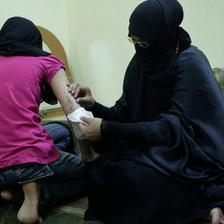

None
Caption:
The law, the report noted, "not only subordinates the needs of the patient to that of the state, it propagates fear among the population."
True val

A protester had a wound re-dressed in a house acting as a makeshift clinic after she was hit by a police tear-gas canister.





['A', 'protester', 'had', 'a', 'wound', 're-dressed', 'in', 'a', 'house', 'acting', 'as', 'a', 'makeshift', 'clinic', 'after', 'she', 'was', 'hit', 'by', 'a', 'police', 'tear-gas', 'canister.']
['The', 'law,', 'the', 'report', 'noted,', '"not', 'only', 'subordinates', 'the', 'needs', 'of', 'the', 'patient', 'to', 'that', 'of', 'the', 'state,', 'it', 'propagates', 'fear', 'among', 'the', 'population."']
0


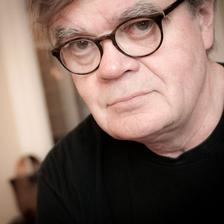

None
Caption:
The memory of the smell of exhaust and pines and wet forest floor is permanent.
True val

Garrison Keillor of “A Prairie Home Companion."





['Garrison', 'Keillor', 'of', '“A', 'Prairie', 'Home', 'Companion."']
['The', 'memory', 'of', 'the', 'smell', 'of', 'exhaust', 'and', 'pines', 'and', 'wet', 'forest', 'floor', 'is', 'permanent.']
0


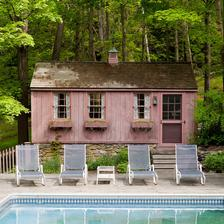

None
Caption:
Some of her clients would prefer to sell their homes, but either can't or won't until the market improves, and are renting in the meantime.
True val

THE WATER’S WARM The owner of a house with a pool in Sharon used a broker this year and found a renter for the whole season months ago. Last August, the house sat empty.





['THE', 'WATER’S', 'WARM', 'The', 'owner', 'of', 'a', 'house', 'with', 'a', 'pool', 'in', 'Sharon', 'used', 'a', 'broker', 'this', 'year', 'and', 'found', 'a', 'renter', 'for', 'the', 'whole', 'season', 'months', 'ago.', 'Last', 'August,', 'the', 'house', 'sat', 'empty.']
['Some', 'of', 'her', 'clients', 'would', 'prefer', 'to', 'sell', 'their', 'homes,', 'but', 'either', "can't", 'or', "won't", 'until', 'the', 'market', 'improves,', 'and', 'are', 'renting', 'in', 'the', 'meantime.']
0


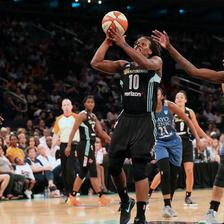

None
Caption:
In recent years, the ownership links between several N.B.A.
True val
Epiphanny Prince, center, of the Liberty playing against the Minnesota Lynx at Madison Square Garden in August.



['Epiphanny', 'Prince,', 'center,', 'of', 'the', 'Liberty', 'playing', 'against', 'the', 'Minnesota', 'Lynx', 'at', 'Madison', 'Square', 'Garden', 'in', 'August.']
['In', 'recent', 'years,', 'the', 'ownership', 'links', 'between', 'several', 'N.B.A.']
0
0.0


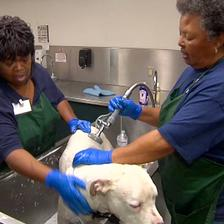

None
Caption:
The rescuers at the puppy mill, like the animal advocates in "Shelter Me," seem somewhat overwhelmed by the cruelty they witness and the scope of the pet overpopulation problem.
True val

Tanya Dukes, left, and Laura Guydon, bathing a dog in “Shelter Me,” broadcast in May and June on PBS stations.





['Tanya', 'Dukes,', 'left,', 'and', 'Laura', 'Guydon,', 'bathing', 'a', 'dog', 'in', '“Shelter', 'Me,”', 'broadcast', 'in', 'May', 'and', 'June', 'on', 'PBS', 'stations.']
['The', 'rescuers', 'at', 'the', 'puppy', 'mill,', 'like', 'the', 'animal', 'advocates', 'in', '"Shelter', 'Me,"', 'seem', 'somewhat', 'overwhelmed', 'by', 'the', 'cruelty', 'they', 'witness', 'and', 'the', 'scope', 'of', 'the', 'pet', 'overpopulation', 'problem.']
0


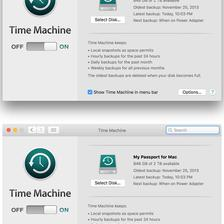

None
Caption:
If you press the Command, Shift and 4 keys and then press the space bar immediately, you can click the highlighted window to take a cropped screenshot of just that window.
True val
If you prefer your screenshots without the 3-D shadow effect, hold down the Option key when you click to capture the image.



['If', 'you', 'prefer', 'your', 'screenshots', 'without', 'the', '3-D', 'shadow', 'effect,', 'hold', 'down', 'the', 'Option', 'key', 'when', 'you', 'click', 'to', 'capture', 'the', 'image.']
['If', 'you', 'press', 'the', 'Command,', 'Shift', 'and', '4', 'keys', 'and', 'then', 'press', 'the', 'space', 'bar', 'immediately,', 'you', 'can', 'click', 'the', 'highlighted', 'window', 'to', 'take', 'a', 'cropped', 'screenshot', 'of', 'just', 'that', 'window.']
0.42379865741502165
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


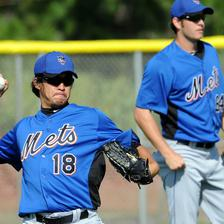

None
Caption:
What that impression is remains unclear.
True val

The Japanese pitcher Ryota Igarashi, left, signed a two-year deal last year, but has not pitched much this spring training.





['The', 'Japanese', 'pitcher', 'Ryota', 'Igarashi,', 'left,', 'signed', 'a', 'two-year', 'deal', 'last', 'year,', 'but', 'has', 'not', 'pitched', 'much', 'this', 'spring', 'training.']
['What', 'that', 'impression', 'is', 'remains', 'unclear.']
0


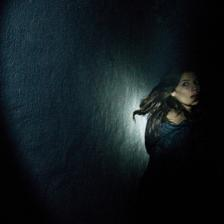

None
Caption:
(Actually, it's hard to get a good view of many things in this picture, thanks to its unrelentingly restless hand-held camera.)
True val

Devin Kelley as one of six travelers who encounter carnivorous humanoids in “Chernobyl Diaries,” directed by Brad Parker.





['Devin', 'Kelley', 'as', 'one', 'of', 'six', 'travelers', 'who', 'encounter', 'carnivorous', 'humanoids', 'in', '“Chernobyl', 'Diaries,”', 'directed', 'by', 'Brad', 'Parker.']
['(Actually,', "it's", 'hard', 'to', 'get', 'a', 'good', 'view', 'of', 'many', 'things', 'in', 'this', 'picture,', 'thanks', 'to', 'its', 'unrelentingly', 'restless', 'hand-held', 'camera.)']
0.4671379777282001


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


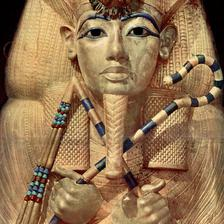

None
Caption:
In "Tutankhamen: The Search for an Egyptian King," Tyldesley has written a crisp, well-researched account of emerging insights into both the life and times of the young king and the modern response, nonsense and all, to his resurrection, as it were, in the modern world.
True val

The outer coffin of Tutankhamen.





['The', 'outer', 'coffin', 'of', 'Tutankhamen.']
['In', '"Tutankhamen:', 'The', 'Search', 'for', 'an', 'Egyptian', 'King,"', 'Tyldesley', 'has', 'written', 'a', 'crisp,', 'well-researched', 'account', 'of', 'emerging', 'insights', 'into', 'both', 'the', 'life', 'and', 'times', 'of', 'the', 'young', 'king', 'and', 'the', 'modern', 'response,', 'nonsense', 'and', 'all,', 'to', 'his', 'resurrection,', 'as', 'it', 'were,', 'in', 'the', 'modern', 'world.']
0.3860973950960897
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


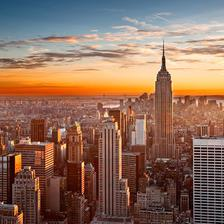

None
Caption:
Queuing up your DVR would feel different outside of New York.
True val

ALLURE  For millions of people, New York City holds an appeal that is not easy to explain.





['ALLURE', 'For', 'millions', 'of', 'people,', 'New', 'York', 'City', 'holds', 'an', 'appeal', 'that', 'is', 'not', 'easy', 'to', 'explain.']
['Queuing', 'up', 'your', 'DVR', 'would', 'feel', 'different', 'outside', 'of', 'New', 'York.']
0
0.5


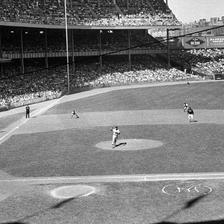

None
Caption:
Skowron, who died April 27 at 81, hit 77 of his 211 major league home runs during the three seasons from 1960 through 1962.
True val

Skowron, pinch-hitting for Joe Pepitone, tied the score in the seventh on an infield roller.





['Skowron,', 'pinch-hitting', 'for', 'Joe', 'Pepitone,', 'tied', 'the', 'score', 'in', 'the', 'seventh', 'on', 'an', 'infield', 'roller.']
['Skowron,', 'who', 'died', 'April', '27', 'at', '81,', 'hit', '77', 'of', 'his', '211', 'major', 'league', 'home', 'runs', 'during', 'the', 'three', 'seasons', 'from', '1960', 'through', '1962.']
0
0.3333333333333333


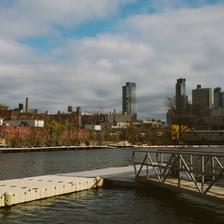

None
Caption:
Plaxall has proposed 4,995 apartments, as well as 335,000 square feet of manufacturing space, which could be leased to tenants like furniture fabricators, breweries or bakeries.
True val
The Anable Basin is a 1,000-foot artificial inlet cut into an industrial section along the East River, in Long Island City.



['The', 'Anable', 'Basin', 'is', 'a', '1,000-foot', 'artificial', 'inlet', 'cut', 'into', 'an', 'industrial', 'section', 'along', 'the', 'East', 'River,', 'in', 'Long', 'Island', 'City.']
['Plaxall', 'has', 'proposed', '4,995', 'apartments,', 'as', 'well', 'as', '335,000', 'square', 'feet', 'of', 'manufacturing', 'space,', 'which', 'could', 'be', 'leased', 'to', 'tenants', 'like', 'furniture', 'fabricators,', 'breweries', 'or', 'bakeries.']
0
0.0


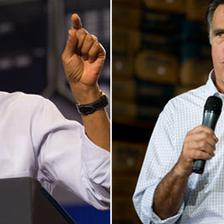

None
Caption:
The economy, he noted, created 130,000 private sector jobs, while the unemployment rate dropped to 8.1 percent from 8.2 percent.
True val

President Obama, in Virginia, and Mitt Romney, in Pittsburgh, offered opinions about the jobless report and the economy.





['President', 'Obama,', 'in', 'Virginia,', 'and', 'Mitt', 'Romney,', 'in', 'Pittsburgh,', 'offered', 'opinions', 'about', 'the', 'jobless', 'report', 'and', 'the', 'economy.']
['The', 'economy,', 'he', 'noted,', 'created', '130,000', 'private', 'sector', 'jobs,', 'while', 'the', 'unemployment', 'rate', 'dropped', 'to', '8.1', 'percent', 'from', '8.2', 'percent.']
0
0.0


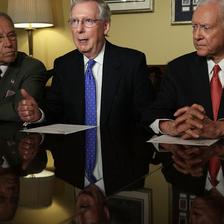

None
Caption:
Tax breaks that phase in or out to make the 10-year budget impact look smaller?
True val
Mitch McConnell, center, at a meeting last week with members of the Senate Finance Committee to discuss tax legislation.



['Mitch', 'McConnell,', 'center,', 'at', 'a', 'meeting', 'last', 'week', 'with', 'members', 'of', 'the', 'Senate', 'Finance', 'Committee', 'to', 'discuss', 'tax', 'legislation.']
['Tax', 'breaks', 'that', 'phase', 'in', 'or', 'out', 'to', 'make', 'the', '10-year', 'budget', 'impact', 'look', 'smaller?']
0


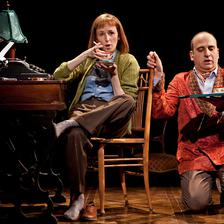

None
Caption:
No matter what their nationalities, all the members of February House (the name comes from the many February birthdays in the group) are expatriates of a sort, exiles from lands that have no place for them.
True val

February House Kristen Sieh and Julian Fleisher in this new musical at the Public Theater.





['February', 'House', 'Kristen', 'Sieh', 'and', 'Julian', 'Fleisher', 'in', 'this', 'new', 'musical', 'at', 'the', 'Public', 'Theater.']
['No', 'matter', 'what', 'their', 'nationalities,', 'all', 'the', 'members', 'of', 'February', 'House', '(the', 'name', 'comes', 'from', 'the', 'many', 'February', 'birthdays', 'in', 'the', 'group)', 'are', 'expatriates', 'of', 'a', 'sort,', 'exiles', 'from', 'lands', 'that', 'have', 'no', 'place', 'for', 'them.']
0.408248290463863
1.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


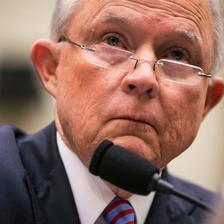

None
Caption:
Sessions spent most of Tuesday's hearing as he has all the others he's sat through this year -- by not recalling things that one would think most people would.
True val
Attorney General Jeff Sessions testifying on Capitol Hill on Tuesday.



['Attorney', 'General', 'Jeff', 'Sessions', 'testifying', 'on', 'Capitol', 'Hill', 'on', 'Tuesday.']
['Sessions', 'spent', 'most', 'of', "Tuesday's", 'hearing', 'as', 'he', 'has', 'all', 'the', 'others', "he's", 'sat', 'through', 'this', 'year', '--', 'by', 'not', 'recalling', 'things', 'that', 'one', 'would', 'think', 'most', 'people', 'would.']
0


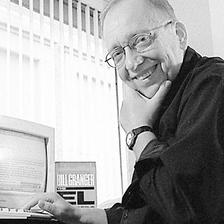

None
Caption:
He was 70.
True val

Bill Granger spent nearly 40 years in journalism.





['Bill', 'Granger', 'spent', 'nearly', '40', 'years', 'in', 'journalism.']
['He', 'was', '70.']
0


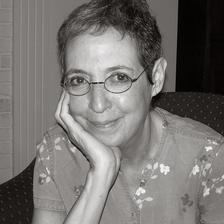

None
Caption:
Later, struggling through treatment, she layers on socks and sweaters, "bulking up," though "the freezing cold seeps into my heart."
True val

Susan Gubar





['Susan', 'Gubar']
['Later,', 'struggling', 'through', 'treatment,', 'she', 'layers', 'on', 'socks', 'and', 'sweaters,', '"bulking', 'up,"', 'though', '"the', 'freezing', 'cold', 'seeps', 'into', 'my', 'heart."']
0


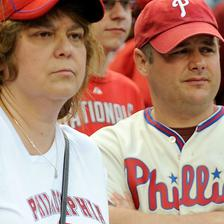

None
Caption:
Feffer chuckled away the "reverse psychology" theory before the series, explaining that restoring a home vibe to home games "has become a civic issue" in Washington.
True val

Philadelphia followers again came out in force for a weekend series in Washington.





['Philadelphia', 'followers', 'again', 'came', 'out', 'in', 'force', 'for', 'a', 'weekend', 'series', 'in', 'Washington.']
['Feffer', 'chuckled', 'away', 'the', '"reverse', 'psychology"', 'theory', 'before', 'the', 'series,', 'explaining', 'that', 'restoring', 'a', 'home', 'vibe', 'to', 'home', 'games', '"has', 'become', 'a', 'civic', 'issue"', 'in', 'Washington.']
0.5266403878479265
0.5


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


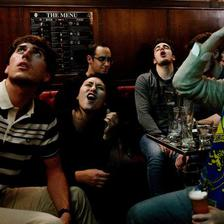

None
Caption:
"I'm sorry," he said, adding, "We failed at something that also means something on a social level."
True val
Italian fans watching the match in Milan. Italy will miss a World Cup for the first time in 60 years.



['Italian', 'fans', 'watching', 'the', 'match', 'in', 'Milan.', 'Italy', 'will', 'miss', 'a', 'World', 'Cup', 'for', 'the', 'first', 'time', 'in', '60', 'years.']
['"I\'m', 'sorry,"', 'he', 'said,', 'adding,', '"We', 'failed', 'at', 'something', 'that', 'also', 'means', 'something', 'on', 'a', 'social', 'level."']
0.4924790605054523


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


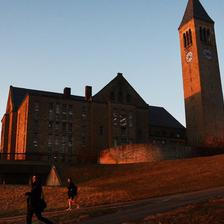

None
Caption:
I'm mentioning this because Cornell does not even contribute enough money to the City of Ithaca to cover the cost of campus fire protection.
True val
The Cornell University campus in Ithaca, N.Y.



['The', 'Cornell', 'University', 'campus', 'in', 'Ithaca,', 'N.Y.']
["I'm", 'mentioning', 'this', 'because', 'Cornell', 'does', 'not', 'even', 'contribute', 'enough', 'money', 'to', 'the', 'City', 'of', 'Ithaca', 'to', 'cover', 'the', 'cost', 'of', 'campus', 'fire', 'protection.']
0
0.5


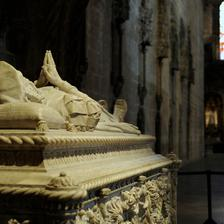

None
Caption:
"That mass consumerism and standardization could somehow be reconciled with rampant individualism was one of the smartest tricks ever pulled by Western civilization," he says.
True val

The tomb of the Portuguese explorer Vasco da Gama.





['The', 'tomb', 'of', 'the', 'Portuguese', 'explorer', 'Vasco', 'da', 'Gama.']
['"That', 'mass', 'consumerism', 'and', 'standardization', 'could', 'somehow', 'be', 'reconciled', 'with', 'rampant', 'individualism', 'was', 'one', 'of', 'the', 'smartest', 'tricks', 'ever', 'pulled', 'by', 'Western', 'civilization,"', 'he', 'says.']
0


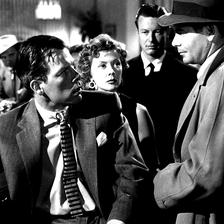

None
Caption:
A few filmmakers have made the theme a personal specialty -- most notably in our time Quentin Tarantino (with the Wagnerian sprawl of his two-part "Kill Bill"), and in the classical past, Fritz Lang, who pursued the theme both in his German films (the second part of his 1924 telling of the Siegfried saga was titled "Kriemhild's Revenge") and in Hollywood (his first American film, the 1936 "Fury," stars Spencer Tracy as a man who survives a lynching attempt and returns to settle the score with the small-town mob that tried to kill him).
True val

Lee Marvin, left in front of Gloria Grahame, is confronted by Glenn Ford in “The Big Heat,” directed by Fritz Lang.





['Lee', 'Marvin,', 'left', 'in', 'front', 'of', 'Gloria', 'Grahame,', 'is', 'confronted', 'by', 'Glenn', 'Ford', 'in', '“The', 'Big', 'Heat,”', 'directed', 'by', 'Fritz', 'Lang.']
['A', 'few', 'filmmakers', 'have', 'made', 'the', 'theme', 'a', 'personal', 'specialty', '--', 'most', 'notably', 'in', 'our', 'time'

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


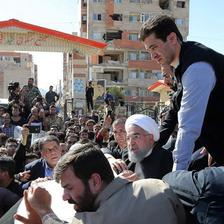

None
Caption:
"Naturally next time they get a job they try to cheat wherever they can," Mr. Laylaz said.
True val
Visiting Sarpol-e Zahab, one of the cities worst hit by the earthquake, President Hassan Rouhani of Iran called for an investigation into the quality of government construction projects.



['Visiting', 'Sarpol-e', 'Zahab,', 'one', 'of', 'the', 'cities', 'worst', 'hit', 'by', 'the', 'earthquake,', 'President', 'Hassan', 'Rouhani', 'of', 'Iran', 'called', 'for', 'an', 'investigation', 'into', 'the', 'quality', 'of', 'government', 'construction', 'projects.']
['"Naturally', 'next', 'time', 'they', 'get', 'a', 'job', 'they', 'try', 'to', 'cheat', 'wherever', 'they', 'can,"', 'Mr.', 'Laylaz', 'said.']
0.4924790605054523
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


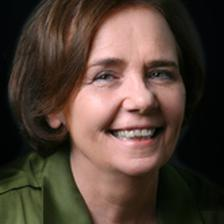

None
Caption:
It hasn't really worked well.
True val

Gail Collins





['Gail', 'Collins']
['It', "hasn't", 'really', 'worked', 'well.']
0


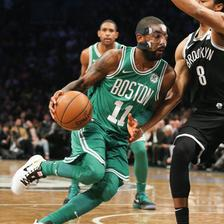

None
Caption:
It was not exactly the Masked Kyrie moment that fans on social media were calling for, but Kyrie Irving of the Celtics returned from a facial fracture and helped lead Boston to a 109-102 win over the Nets on Tuesday.
True val
Kyrie Irving of the Boston Celtics had to wear a mask on Tuesday because he sustained a fracture below his eye in a game on Friday night.



['Kyrie', 'Irving', 'of', 'the', 'Boston', 'Celtics', 'had', 'to', 'wear', 'a', 'mask', 'on', 'Tuesday', 'because', 'he', 'sustained', 'a', 'fracture', 'below', 'his', 'eye', 'in', 'a', 'game', 'on', 'Friday', 'night.']
['It', 'was', 'not', 'exactly', 'the', 'Masked', 'Kyrie', 'moment', 'that', 'fans', 'on', 'social', 'media', 'were', 'calling', 'for,', 'but', 'Kyrie', 'Irving', 'of', 'the', 'Celtics', 'returned', 'from', 'a', 'facial', 'fracture', 'and', 'helped', 'lead', 'Boston', 'to', 'a', '109-102', 'win', 'over', 'the', 'Nets', 'on', 'Tuesday.']
0.3976353643835253
0.4


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


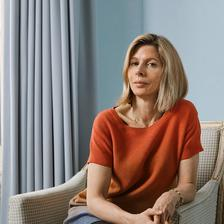

None
Caption:
But they played along because to them the meal was an anthropological adventure, a phenomenon experienced inside quotation marks.
True val
Sarah Lyall



['Sarah', 'Lyall']
['But', 'they', 'played', 'along', 'because', 'to', 'them', 'the', 'meal', 'was', 'an', 'anthropological', 'adventure,', 'a', 'phenomenon', 'experienced', 'inside', 'quotation', 'marks.']
0.47897362544357464


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


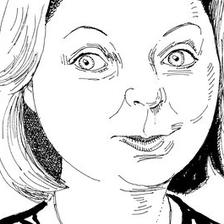

None
Caption:
There may be nonliterary reasons for this: Mantel, who has been in ill health for much of her life, doesn't live in London, doesn't have a posh accent, doesn't travel much, doesn't regularly turn up on the chat shows.
True val

Hilary Mantel





['Hilary', 'Mantel']
['There', 'may', 'be', 'nonliterary', 'reasons', 'for', 'this:', 'Mantel,', 'who', 'has', 'been', 'in', 'ill', 'health', 'for', 'much', 'of', 'her', 'life,', "doesn't", 'live', 'in', 'London,', "doesn't", 'have', 'a', 'posh', 'accent,', "doesn't", 'travel', 'much,', "doesn't", 'regularly', 'turn', 'up', 'on', 'the', 'chat', 'shows.']
0.4001601601922499
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


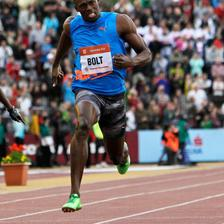

None
Caption:
"It will be the most awesome show," Bolt said, "and I'm going there to do great things."
True val

Running into a slight headwind, Usain Bolt won the 100 meters Friday in Ostrava, Czech Republic. But his time, 10.04 seconds, was his slowest in three years.





['Running', 'into', 'a', 'slight', 'headwind,', 'Usain', 'Bolt', 'won', 'the', '100', 'meters', 'Friday', 'in', 'Ostrava,', 'Czech', 'Republic.', 'But', 'his', 'time,', '10.04', 'seconds,', 'was', 'his', 'slowest', 'in', 'three', 'years.']
['"It', 'will', 'be', 'the', 'most', 'awesome', 'show,"', 'Bolt', 'said,', '"and', "I'm", 'going', 'there', 'to', 'do', 'great', 'things."']
0
1.0


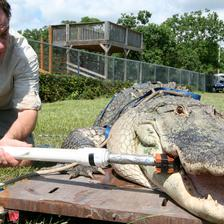

None
Caption:
"It was one of the more exciting things I've ever done."
True val

Greg Erickson, a researcher at Florida State University, testing the bite force of an American alligator with a device he designed.





['Greg', 'Erickson,', 'a', 'researcher', 'at', 'Florida', 'State', 'University,', 'testing', 'the', 'bite', 'force', 'of', 'an', 'American', 'alligator', 'with', 'a', 'device', 'he', 'designed.']
['"It', 'was', 'one', 'of', 'the', 'more', 'exciting', 'things', "I've", 'ever', 'done."']
0


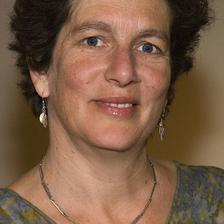

None
Caption:
She was 60.
True val
Debra Chasnoff in 2008. She was said to have been the first female Academy Award recipient to thank a same-sex partner from the Oscar stage.



['Debra', 'Chasnoff', 'in', '2008.', 'She', 'was', 'said', 'to', 'have', 'been', 'the', 'first', 'female', 'Academy', 'Award', 'recipient', 'to', 'thank', 'a', 'same-sex', 'partner', 'from', 'the', 'Oscar', 'stage.']
['She', 'was', '60.']
0


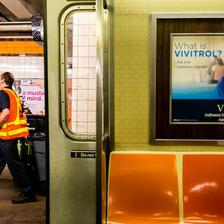

None
Caption:
The study, funded by the federal government, compared Vivitrol, which comes in a monthly shot and blocks the effects of opioids, and Suboxone, which is taken daily in strips that dissolve on the tongue and contains a relatively mild opioid that helps minimize withdrawal symptoms and cravings.
True val
Ads for Vivitrol in a subway car in Brooklyn.



['Ads', 'for', 'Vivitrol', 'in', 'a', 'subway', 'car', 'in', 'Brooklyn.']
['The', 'study,', 'funded', 'by', 'the', 'federal', 'government,', 'compared', 'Vivitrol,', 'which', 'comes', 'in', 'a', 'monthly', 'shot', 'and', 'blocks', 'the', 'effects', 'of', 'opioids,', 'and', 'Suboxone,', 'which', 'is', 'taken', 'daily', 'in', 'strips', 'that', 'dissolve', 'on', 'the', 'tongue', 'and', 'contains', 'a', 'relatively', 'mild', 'opioid', 'that', 'helps', 'minimize', 'withdrawal', 'symptoms', 'and', 'cravings.']
0.3819227559309534
0.5


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


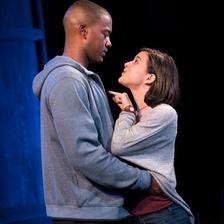

None
Caption:
On the contrary, he finds her "macro-aggressions" strangely adorable.
True val
Joshua Boone and Alexandra Socha in the Manhattan Theater Club production of Anna Ziegler’s “Actually.”



['Joshua', 'Boone', 'and', 'Alexandra', 'Socha', 'in', 'the', 'Manhattan', 'Theater', 'Club', 'production', 'of', 'Anna', 'Ziegler’s', '“Actually.”']
['On', 'the', 'contrary,', 'he', 'finds', 'her', '"macro-aggressions"', 'strangely', 'adorable.']
0


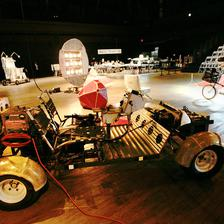

None
Caption:
Mr. Sachs is not a rocket scientist but a sculptor who creates rough copies of technologically complicated objects out of plywood, foam core, tape, glue, nuts and bolts and other materials -- including real objects like propane torches, hand tools, boomboxes and thermoses -- readily available from Home Depot and other vendors.
True val

The sculptor Tom Sachs has created a model Mars mission, including a “Mars Excursion Roving Vehicle,” at the Park Avenue Armory.





['The', 'sculptor', 'Tom', 'Sachs', 'has', 'created', 'a', 'model', 'Mars', 'mission,', 'including', 'a', '“Mars', 'Excursion', 'Roving', 'Vehicle,”', 'at', 'the', 'Park', 'Avenue', 'Armory.']
['Mr.', 'Sachs', 'is', 'not', 'a', 'rocket', 'scientist', 'but', 'a', 'sculptor', 'who', 'creates', 'rough', 'copies', 'of', 'technologically', 'complicated', 'objects', 'out', 'of', 'plywood,', 'foam', 'core,', 'tape,', 'glue,', 'nuts', 'and', 'bolts', 'and', 'other', 'materials', '--', 'including', 'real', 'objects',

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


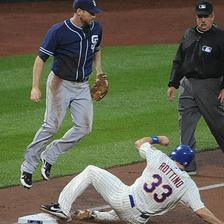

None
Caption:
"I thought I could overcome it, no doubt, but I just left balls up."
True val

Vinny Rottino stole third in the second, then scored on a throw that could not be fielded by Padres third baseman Chase Headley.





['Vinny', 'Rottino', 'stole', 'third', 'in', 'the', 'second,', 'then', 'scored', 'on', 'a', 'throw', 'that', 'could', 'not', 'be', 'fielded', 'by', 'Padres', 'third', 'baseman', 'Chase', 'Headley.']
['"I', 'thought', 'I', 'could', 'overcome', 'it,', 'no', 'doubt,', 'but', 'I', 'just', 'left', 'balls', 'up."']
0


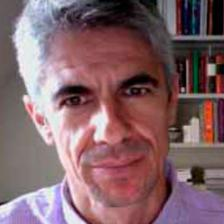

None
Caption:
"I want the holes to be filled before I can move on."
True val

Friends and colleagues say Antonio Calvo had been dismissed.





['Friends', 'and', 'colleagues', 'say', 'Antonio', 'Calvo', 'had', 'been', 'dismissed.']
['"I', 'want', 'the', 'holes', 'to', 'be', 'filled', 'before', 'I', 'can', 'move', 'on."']
0


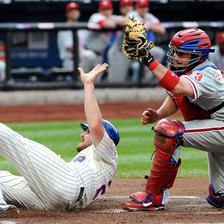

None
Caption:
... Miguel Batista (strained back) gave up five runs, four hits and four walks during a seven-inning rehabilitation start for Class AA Binghamton.
True val

The Mets’ Daniel Murphy beat Brian Schneider’s tag in the first inning.





['The', 'Mets’', 'Daniel', 'Murphy', 'beat', 'Brian', 'Schneider’s', 'tag', 'in', 'the', 'first', 'inning.']
['...', 'Miguel', 'Batista', '(strained', 'back)', 'gave', 'up', 'five', 'runs,', 'four', 'hits', 'and', 'four', 'walks', 'during', 'a', 'seven-inning', 'rehabilitation', 'start', 'for', 'Class', 'AA', 'Binghamton.']
0.4566337854967312
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


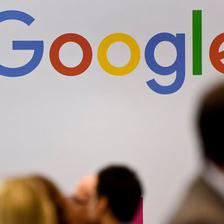

None
Caption:
He said, however, that Google had "strong privacy protections in place for our users" and that it continued "to operate in a highly competitive and dynamic environment."
True val
Missouri’s investigation demonstrates how states and Europe have begun to take the lead on examining Google, which has avoided antitrust scrutiny from federal regulators.



['Missouri’s', 'investigation', 'demonstrates', 'how', 'states', 'and', 'Europe', 'have', 'begun', 'to', 'take', 'the', 'lead', 'on', 'examining', 'Google,', 'which', 'has', 'avoided', 'antitrust', 'scrutiny', 'from', 'federal', 'regulators.']
['He', 'said,', 'however,', 'that', 'Google', 'had', '"strong', 'privacy', 'protections', 'in', 'place', 'for', 'our', 'users"', 'and', 'that', 'it', 'continued', '"to', 'operate', 'in', 'a', 'highly', 'competitive', 'and', 'dynamic', 'environment."']
0.4386913376508308
1.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


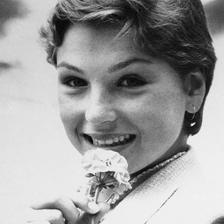

None
Caption:
"Why would I want a big picture of myself next to me?"
True val
Ms. O’Neal at 14, the year she filmed “International Velvet.”



['Ms.', 'O’Neal', 'at', '14,', 'the', 'year', 'she', 'filmed', '“International', 'Velvet.”']
['"Why', 'would', 'I', 'want', 'a', 'big', 'picture', 'of', 'myself', 'next', 'to', 'me?"']
0.5408536609893481


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


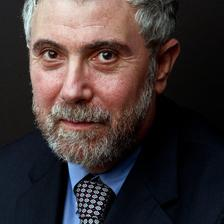

None
Caption:
Until now the attack of the fiscal phonies has been mainly a national rather than a state issue, with , the chairman of the House Budget Committee, as the prime example.
True val

Paul Krugman





['Paul', 'Krugman']
['Until', 'now', 'the', 'attack', 'of', 'the', 'fiscal', 'phonies', 'has', 'been', 'mainly', 'a', 'national', 'rather', 'than', 'a', 'state', 'issue,', 'with', ',', 'the', 'chairman', 'of', 'the', 'House', 'Budget', 'Committee,', 'as', 'the', 'prime', 'example.']
0.42379865741502165
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


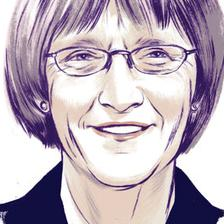

None
Caption:
In a more serious vein, I much admire Clark Kerr's "The Uses of the University," which was originally delivered as a series of lectures at Harvard in 1963 and has been amplified in several editions since.
True val

Drew Gilpin Faust





['Drew', 'Gilpin', 'Faust']
['In', 'a', 'more', 'serious', 'vein,', 'I', 'much', 'admire', 'Clark', "Kerr's", '"The', 'Uses', 'of', 'the', 'University,"', 'which', 'was', 'originally', 'delivered', 'as', 'a', 'series', 'of', 'lectures', 'at', 'Harvard', 'in', '1963', 'and', 'has', 'been', 'amplified', 'in', 'several', 'editions', 'since.']
0.408248290463863
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


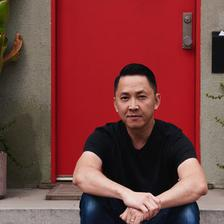

None
Caption:
Imagine your standard-issue bird, but done the Vietnamese way with Vietnamese spices, stuffed with noodles and umami flavors.
True val
Viet Thanh Nguyen



['Viet', 'Thanh', 'Nguyen']
['Imagine', 'your', 'standard-issue', 'bird,', 'but', 'done', 'the', 'Vietnamese', 'way', 'with', 'Vietnamese', 'spices,', 'stuffed', 'with', 'noodles', 'and', 'umami', 'flavors.']
0
0.0


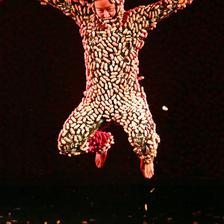

None
Caption:
The companion works reframed Ms. Meier's 2016 solo in which she used her body as a canvas.
True val
Lisa Kusanagi encased in peanuts.



['Lisa', 'Kusanagi', 'encased', 'in', 'peanuts.']
['The', 'companion', 'works', 'reframed', 'Ms.', "Meier's", '2016', 'solo', 'in', 'which', 'she', 'used', 'her', 'body', 'as', 'a', 'canvas.']
0.4924790605054523
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


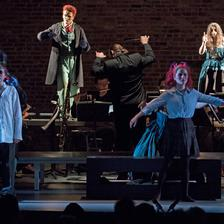

None
Caption:
But from a Prologue sung as if by a zombie head planted atop an upright piano that a headless footman played in mime, this production loaded the gothic tale with creep show antics redolent of Tim Burton films like "Beetlejuice" and "Dark Shadows."
True val

Pacien Mazzagatti conducts, from left, Benjamin P. Wenzelberg, Glenn Seven Allen, Vivian Krich-Brinton and Elspeth Davis in “The Turn of the Screw.”





['Pacien', 'Mazzagatti', 'conducts,', 'from', 'left,', 'Benjamin', 'P.', 'Wenzelberg,', 'Glenn', 'Seven', 'Allen,', 'Vivian', 'Krich-Brinton', 'and', 'Elspeth', 'Davis', 'in', '“The', 'Turn', 'of', 'the', 'Screw.”']
['But', 'from', 'a', 'Prologue', 'sung', 'as', 'if', 'by', 'a', 'zombie', 'head', 'planted', 'atop', 'an', 'upright', 'piano', 'that', 'a', 'headless', 'footman', 'played', 'in', 'mime,', 'this', 'production', 'loaded', 'the', 'gothic', 'tale', 'with', 'creep', 'show', 'antics', 'redolent', 'of', 'Tim', 'Burton', 'films', 'like', '"Beetlejuice"', 'and', '"

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


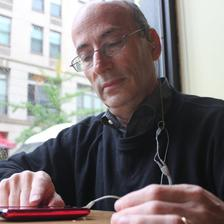

None
Caption:
It attaches to the TV audio output and can either run around the edges of the room or just be placed inside a mat that sits beneath a chair, or in a pad that tucks under a cushion.
True val

In a noisy restaurant, earphones and an iPhone app that amplifies and processes sound help Richard Einhorn, a composer, converse with friends.





['In', 'a', 'noisy', 'restaurant,', 'earphones', 'and', 'an', 'iPhone', 'app', 'that', 'amplifies', 'and', 'processes', 'sound', 'help', 'Richard', 'Einhorn,', 'a', 'composer,', 'converse', 'with', 'friends.']
['It', 'attaches', 'to', 'the', 'TV', 'audio', 'output', 'and', 'can', 'either', 'run', 'around', 'the', 'edges', 'of', 'the', 'room', 'or', 'just', 'be', 'placed', 'inside', 'a', 'mat', 'that', 'sits', 'beneath', 'a', 'chair,', 'or', 'in', 'a', 'pad', 'that', 'tucks', 'under', 'a', 'cushion.']
0.47897362544357464


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


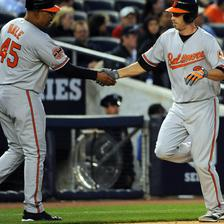

None
Caption:
Hughes also made mistakes, especially the fastball to Hardy.
True val

The Orioles’ J.J. Hardy after hitting a two-run home run in the third inning for a 3-1 lead. It was one of two homers off Hughes.





['The', 'Orioles’', 'J.J.', 'Hardy', 'after', 'hitting', 'a', 'two-run', 'home', 'run', 'in', 'the', 'third', 'inning', 'for', 'a', '3-1', 'lead.', 'It', 'was', 'one', 'of', 'two', 'homers', 'off', 'Hughes.']
['Hughes', 'also', 'made', 'mistakes,', 'especially', 'the', 'fastball', 'to', 'Hardy.']
0
1.0


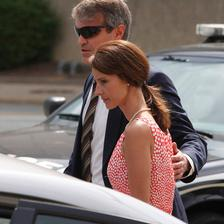

None
Caption:
it began.
True val

Cheri Young in Greensboro, N.C., on Monday, after testifying about John Edwards’s affair.





['Cheri', 'Young', 'in', 'Greensboro,', 'N.C.,', 'on', 'Monday,', 'after', 'testifying', 'about', 'John', 'Edwards’s', 'affair.']
['it', 'began.']
0


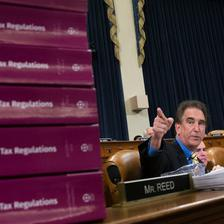

None
Caption:
In recent weeks, however, backers of the Republican plan have emphasized a related claim: If companies paid less in taxes, they would pay their workers more.
True val
Representative Jim Renacci, Republican of Ohio, delivering remarks during a House Ways and Means Committee meeting on a tax overhaul plan.



['Representative', 'Jim', 'Renacci,', 'Republican', 'of', 'Ohio,', 'delivering', 'remarks', 'during', 'a', 'House', 'Ways', 'and', 'Means', 'Committee', 'meeting', 'on', 'a', 'tax', 'overhaul', 'plan.']
['In', 'recent', 'weeks,', 'however,', 'backers', 'of', 'the', 'Republican', 'plan', 'have', 'emphasized', 'a', 'related', 'claim:', 'If', 'companies', 'paid', 'less', 'in', 'taxes,', 'they', 'would', 'pay', 'their', 'workers', 'more.']
0.4428500142691474
1.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


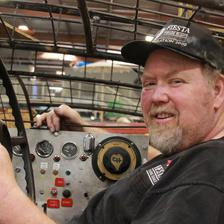

None
Caption:
Hydraulic and electronic systems increasingly operate the floats' articulation and animation.
True val

FLOWER POWER Tim Estes of Fiesta Parade Floats at the wheel of the Girl Scouts' 2012 entry.





['FLOWER', 'POWER', 'Tim', 'Estes', 'of', 'Fiesta', 'Parade', 'Floats', 'at', 'the', 'wheel', 'of', 'the', 'Girl', "Scouts'", '2012', 'entry.']
['Hydraulic', 'and', 'electronic', 'systems', 'increasingly', 'operate', 'the', "floats'", 'articulation', 'and', 'animation.']
0


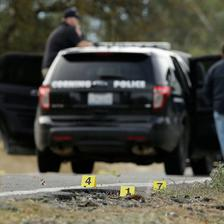

None
Caption:
There were at least seven separate shooting scenes in or near Rancho Tehama Reserve, an unincorporated community of about 1,500 people, Phil Johnston, assistant sheriff of Tehama County, told reporters.
True val
The police placed markers where casings were found at one of the scenes of a shooting spree in Northern California.



['The', 'police', 'placed', 'markers', 'where', 'casings', 'were', 'found', 'at', 'one', 'of', 'the', 'scenes', 'of', 'a', 'shooting', 'spree', 'in', 'Northern', 'California.']
['There', 'were', 'at', 'least', 'seven', 'separate', 'shooting', 'scenes', 'in', 'or', 'near', 'Rancho', 'Tehama', 'Reserve,', 'an', 'unincorporated', 'community', 'of', 'about', '1,500', 'people,', 'Phil', 'Johnston,', 'assistant', 'sheriff', 'of', 'Tehama', 'County,', 'told', 'reporters.']
0
0.0


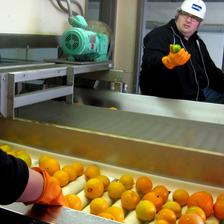

None
Caption:
This habit gives us a taste, vicariously, of how our food becomes what we know it to be.
True val

Bobby Bognar, host of “Food Tech,” sorting oranges in an episode of the series, which begins Thursday on History.





['Bobby', 'Bognar,', 'host', 'of', '“Food', 'Tech,”', 'sorting', 'oranges', 'in', 'an', 'episode', 'of', 'the', 'series,', 'which', 'begins', 'Thursday', 'on', 'History.']
['This', 'habit', 'gives', 'us', 'a', 'taste,', 'vicariously,', 'of', 'how', 'our', 'food', 'becomes', 'what', 'we', 'know', 'it', 'to', 'be.']
0.4854917717073234


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


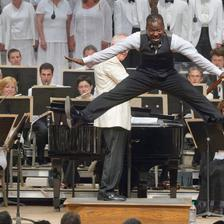

None
Caption:
Or rather, was supposed to roar.
True val

The tenor Jermaine Smith performing in “Porgy and Bess” with the Boston Symphony, directed by Bramwell Tovey, and the Tanglewood Festival Chorus on Friday.





['The', 'tenor', 'Jermaine', 'Smith', 'performing', 'in', '“Porgy', 'and', 'Bess”', 'with', 'the', 'Boston', 'Symphony,', 'directed', 'by', 'Bramwell', 'Tovey,', 'and', 'the', 'Tanglewood', 'Festival', 'Chorus', 'on', 'Friday.']
['Or', 'rather,', 'was', 'supposed', 'to', 'roar.']
0


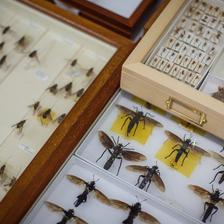

None
Caption:
But, honestly, they should be looking at the Democrats.
True val
Fly specimens at the Natural History Museum in London.



['Fly', 'specimens', 'at', 'the', 'Natural', 'History', 'Museum', 'in', 'London.']
['But,', 'honestly,', 'they', 'should', 'be', 'looking', 'at', 'the', 'Democrats.']
0
0.0


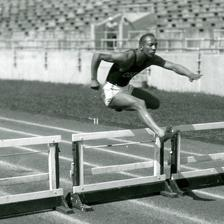

None
Caption:
But a more interesting and complex documentary would take a closer look at Owens's accommodations with the systems that both celebrated and oppressed him, and his lifelong reluctance to be seen as a spokesman for change, issues that are noted briefly in "Jesse Owens."
True val

Jesse Owens  The track star, shown practicing hurdles in 1935, is examined in this documentary being shown on Tuesday night on PBS stations (check local listings).





['Jesse', 'Owens', 'The', 'track', 'star,', 'shown', 'practicing', 'hurdles', 'in', '1935,', 'is', 'examined', 'in', 'this', 'documentary', 'being', 'shown', 'on', 'Tuesday', 'night', 'on', 'PBS', 'stations', '(check', 'local', 'listings).']
['But', 'a', 'more', 'interesting', 'and', 'complex', 'documentary', 'would', 'take', 'a', 'closer', 'look', 'at', "Owens's", 'accommodations', 'with', 'the', 'systems', 'that', 'both', 'celebrated', 'and', 'oppressed', 'him,', 'and', 'his', 'lifelong', 'reluctance', 'to', 'be', 'seen', 'as', 'a

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


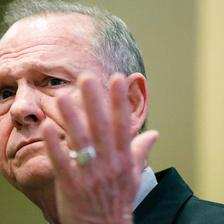

None
Caption:
Today Christians are more likely to argue that the liberal order itself is intolerant toward faith.
True val
Many conservative evangelicals in Alabama still support Roy Moore. Why?



['Many', 'conservative', 'evangelicals', 'in', 'Alabama', 'still', 'support', 'Roy', 'Moore.', 'Why?']
['Today', 'Christians', 'are', 'more', 'likely', 'to', 'argue', 'that', 'the', 'liberal', 'order', 'itself', 'is', 'intolerant', 'toward', 'faith.']
0
0.0


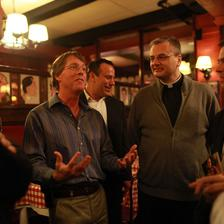

None
Caption:
So far "Leap of Faith," which does not include Jesus as a character, has proved less controversial with both Christian and Jewish groups than "Godspell" or "Jesus Christ Superstar," the sales agents say.
True val

Tom Allen, center, with Rev. Richard D. Baker at a reception at Sardi’s, where he mingled with religious theatergoers after seeing “Leap of Faith,” one of many shows with religious overtones.





['Tom', 'Allen,', 'center,', 'with', 'Rev.', 'Richard', 'D.', 'Baker', 'at', 'a', 'reception', 'at', 'Sardi’s,', 'where', 'he', 'mingled', 'with', 'religious', 'theatergoers', 'after', 'seeing', '“Leap', 'of', 'Faith,”', 'one', 'of', 'many', 'shows', 'with', 'religious', 'overtones.']
['So', 'far', '"Leap', 'of', 'Faith,"', 'which', 'does', 'not', 'include', 'Jesus', 'as', 'a', 'character,', 'has', 'proved', 'less', 'controversial', 'with', 'both', 'Christian', 'and', 'Jewish', 'groups', 'than', '"Godspell"', 'or', '"Jesus', 'Christ', 'Superstar,"', 'the', 'sales', 'ag

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


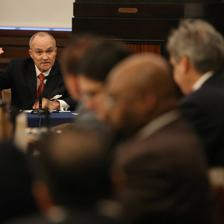

None
Caption:
Ms. Quinn, who disclosed the letter from Mr. Kelly, said that the steps were significant but that more must be done.
True val

Police Commissioner Raymond W. Kelly at a City Council hearing on Thursday. His steps to rein in stop-and-frisk abuse include a re-emphasis on an existing order that bans racial profiling.





['Police', 'Commissioner', 'Raymond', 'W.', 'Kelly', 'at', 'a', 'City', 'Council', 'hearing', 'on', 'Thursday.', 'His', 'steps', 'to', 'rein', 'in', 'stop-and-frisk', 'abuse', 'include', 'a', 're-emphasis', 'on', 'an', 'existing', 'order', 'that', 'bans', 'racial', 'profiling.']
['Ms.', 'Quinn,', 'who', 'disclosed', 'the', 'letter', 'from', 'Mr.', 'Kelly,', 'said', 'that', 'the', 'steps', 'were', 'significant', 'but', 'that', 'more', 'must', 'be', 'done.']
0
0.5


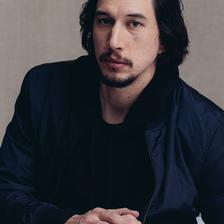

None
Caption:
Since 2008, Arts in the Armed Forces has existed as a kind of matchmaker for members of the military and the theater community, inviting renowned playwrights, actors and directors to perform for, interact with and, hopefully, enrich patrons who may be better equipped for literal minefields than emotional ones.
True val
Adam Driver, founder of Arts in the Armed Forces, served as a Marine before attending Juilliard.



['Adam', 'Driver,', 'founder', 'of', 'Arts', 'in', 'the', 'Armed', 'Forces,', 'served', 'as', 'a', 'Marine', 'before', 'attending', 'Juilliard.']
['Since', '2008,', 'Arts', 'in', 'the', 'Armed', 'Forces', 'has', 'existed', 'as', 'a', 'kind', 'of', 'matchmaker', 'for', 'members', 'of', 'the', 'military', 'and', 'the', 'theater', 'community,', 'inviting', 'renowned', 'playwrights,', 'actors', 'and', 'directors', 'to', 'perform', 'for,', 'interact', 'with', 'and,', 'hopefully,', 'enrich', 'patrons', 'who', 'may', 'be', 'better', 'equipped', 'for', 'literal', 'mi

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


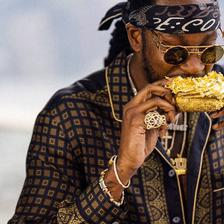

None
Caption:
The second season of "Queen Sugar" comes to a close, while 2 Chainz starts a new show about extravagance on Viceland.
True val
2 Chainz eating a gold-flaked doughnut on “Most Expensivest.”



['2', 'Chainz', 'eating', 'a', 'gold-flaked', 'doughnut', 'on', '“Most', 'Expensivest.”']
['The', 'second', 'season', 'of', '"Queen', 'Sugar"', 'comes', 'to', 'a', 'close,', 'while', '2', 'Chainz', 'starts', 'a', 'new', 'show', 'about', 'extravagance', 'on', 'Viceland.']
0.5555238068023582
0.5


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


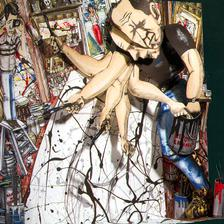

None
Caption:
A copy of the magazine cover is also on view.
True val

Red Grooms’s “Jackson in Action.”





['Red', 'Grooms’s', '“Jackson', 'in', 'Action.”']
['A', 'copy', 'of', 'the', 'magazine', 'cover', 'is', 'also', 'on', 'view.']
0.5623413251903491


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


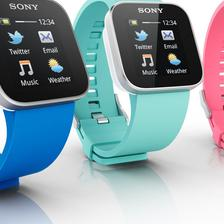

None
Caption:
THE SmartWatch has a sleek color touch screen that works by way of swipes, taps and the occasional two-fingered pinch.
True val

The Sony SmartWatch.




['The', 'Sony', 'SmartWatch.']
['THE', 'SmartWatch', 'has', 'a', 'sleek', 'color', 'touch', 'screen', 'that', 'works', 'by', 'way', 'of', 'swipes,', 'taps', 'and', 'the', 'occasional', 'two-fingered', 'pinch.']
0.4728708045015879
0.5


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


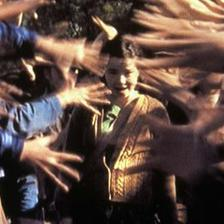

None
Caption:
"Instead of moaning and becoming really angry, we need to actually come up with suggestions of what the world we want to live in, in the future, could be.
True val
Björk in a scene from “Dancer in the Dark.” She said she faced sexual harassment from the film’s director, Lars von Trier, on the set.



['Björk', 'in', 'a', 'scene', 'from', '“Dancer', 'in', 'the', 'Dark.”', 'She', 'said', 'she', 'faced', 'sexual', 'harassment', 'from', 'the', 'film’s', 'director,', 'Lars', 'von', 'Trier,', 'on', 'the', 'set.']
['"Instead', 'of', 'moaning', 'and', 'becoming', 'really', 'angry,', 'we', 'need', 'to', 'actually', 'come', 'up', 'with', 'suggestions', 'of', 'what', 'the', 'world', 'we', 'want', 'to', 'live', 'in,', 'in', 'the', 'future,', 'could', 'be.']
0


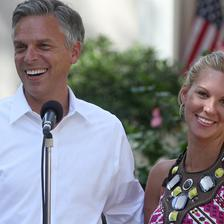

None
Caption:
In an e-mail four days earlier, she said her sister had ridden in a car with Mr. Bo after dinner but "didn't take notice of the car type."
True val

Jon M. Huntsman Jr. with his eldest daughter Mary Anne at his residence in Beijing in 2009.





['Jon', 'M.', 'Huntsman', 'Jr.', 'with', 'his', 'eldest', 'daughter', 'Mary', 'Anne', 'at', 'his', 'residence', 'in', 'Beijing', 'in', '2009.']
['In', 'an', 'e-mail', 'four', 'days', 'earlier,', 'she', 'said', 'her', 'sister', 'had', 'ridden', 'in', 'a', 'car', 'with', 'Mr.', 'Bo', 'after', 'dinner', 'but', '"didn\'t', 'take', 'notice', 'of', 'the', 'car', 'type."']
0.4347208719449914
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


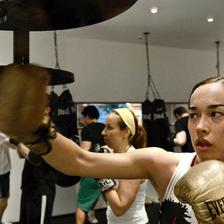

None
Caption:
In unison with about 20 other students -- an even mix of men and women -- I started throwing right jabs into a heavy bag in time to pumping house music.
True val

Yurika Foster working the speed bag at the Aerospace High Performance Center.





['Yurika', 'Foster', 'working', 'the', 'speed', 'bag', 'at', 'the', 'Aerospace', 'High', 'Performance', 'Center.']
['In', 'unison', 'with', 'about', '20', 'other', 'students', '--', 'an', 'even', 'mix', 'of', 'men', 'and', 'women', '--', 'I', 'started', 'throwing', 'right', 'jabs', 'into', 'a', 'heavy', 'bag', 'in', 'time', 'to', 'pumping', 'house', 'music.']
0.42379865741502165
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


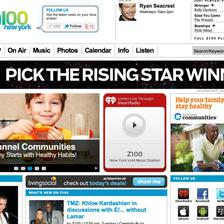

None
Caption:
For example, one lists the "hundreds of fun and simple things you and your family can do to live a healthier lifestyle," including "walk to work, walk the dog, have the dog walk you.
True val

A mock-up of one of the new online ads created by Clear Channel and the Advertising Council featured on Z100's Web site.




['A', 'mock-up', 'of', 'one', 'of', 'the', 'new', 'online', 'ads', 'created', 'by', 'Clear', 'Channel', 'and', 'the', 'Advertising', 'Council', 'featured', 'on', "Z100's", 'Web', 'site.']
['For', 'example,', 'one', 'lists', 'the', '"hundreds', 'of', 'fun', 'and', 'simple', 'things', 'you', 'and', 'your', 'family', 'can', 'do', 'to', 'live', 'a', 'healthier', 'lifestyle,"', 'including', '"walk', 'to', 'work,', 'walk', 'the', 'dog,', 'have', 'the', 'dog', 'walk', 'you.']
0.41412387656655203
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


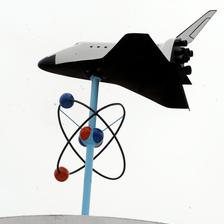

None
Caption:
In a worst-case scenario, which is unlikely, the world could run out of helium in a century, said Chip Groat, a geology professor at the University of Texas at Austin.
True val

A weather vane at the plant. The space shuttle program, which ended last summer, was a major user of helium produced here.





['A', 'weather', 'vane', 'at', 'the', 'plant.', 'The', 'space', 'shuttle', 'program,', 'which', 'ended', 'last', 'summer,', 'was', 'a', 'major', 'user', 'of', 'helium', 'produced', 'here.']
['In', 'a', 'worst-case', 'scenario,', 'which', 'is', 'unlikely,', 'the', 'world', 'could', 'run', 'out', 'of', 'helium', 'in', 'a', 'century,', 'said', 'Chip', 'Groat,', 'a', 'geology', 'professor', 'at', 'the', 'University', 'of', 'Texas', 'at', 'Austin.']
0.42728700639623407
0.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


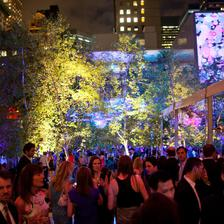

None
Caption:
But the marriage here was of art and money.
True val

The Museum of Modern Art had its annual garden party on Tuesday night, drawing top donors and a parade of artists to its lush outdoor sculpture garden for cocktails. A dinner of fresh asparagus, lobster salad and steak followed.





['The', 'Museum', 'of', 'Modern', 'Art', 'had', 'its', 'annual', 'garden', 'party', 'on', 'Tuesday', 'night,', 'drawing', 'top', 'donors', 'and', 'a', 'parade', 'of', 'artists', 'to', 'its', 'lush', 'outdoor', 'sculpture', 'garden', 'for', 'cocktails.', 'A', 'dinner', 'of', 'fresh', 'asparagus,', 'lobster', 'salad', 'and', 'steak', 'followed.']
['But', 'the', 'marriage', 'here', 'was', 'of', 'art', 'and', 'money.']
0


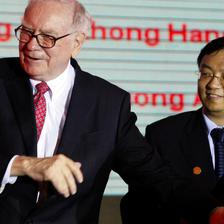

None
Caption:
Although BYD's shares bounced back on Tuesday as investors appeared to accept the company's explanation, BYD's longer-term challenges remain.
True val

Warren Buffett, left, bought a 10 percent stake in BYD. At right is Wang Chuanfu, the company’s founder and chairman.





['Warren', 'Buffett,', 'left,', 'bought', 'a', '10', 'percent', 'stake', 'in', 'BYD.', 'At', 'right', 'is', 'Wang', 'Chuanfu,', 'the', 'company’s', 'founder', 'and', 'chairman.']
['Although', "BYD's", 'shares', 'bounced', 'back', 'on', 'Tuesday', 'as', 'investors', 'appeared', 'to', 'accept', 'the', "company's", 'explanation,', "BYD's", 'longer-term', 'challenges', 'remain.']
0
1.0


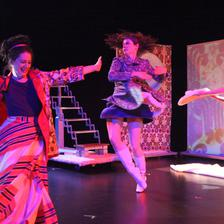

None
Caption:
.
True val

"Comme Toujours Here I Stand:" From left, Molly Hickok, Tymberly Canale and Kourtney Rutherford of Big Dance Theater, at New York Live Arts.





['"Comme', 'Toujours', 'Here', 'I', 'Stand:"', 'From', 'left,', 'Molly', 'Hickok,', 'Tymberly', 'Canale', 'and', 'Kourtney', 'Rutherford', 'of', 'Big', 'Dance', 'Theater,', 'at', 'New', 'York', 'Live', 'Arts.']
['.']
1.0


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


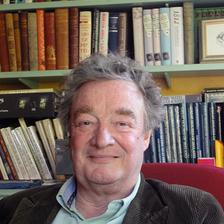

None
Caption:
And the meditative calm of his still lifes: a clutch of tulips or lilies in a vase, a teacup and wineglass, or some peeled lemons sitting incandescently on a plate.
True val

Christopher Simon Sykes





['Christopher', 'Simon', 'Sykes']
['And', 'the', 'meditative', 'calm', 'of', 'his', 'still', 'lifes:', 'a', 'clutch', 'of', 'tulips', 'or', 'lilies', 'in', 'a', 'vase,', 'a', 'teacup', 'and', 'wineglass,', 'or', 'some', 'peeled', 'lemons', 'sitting', 'incandescently', 'on', 'a', 'plate.']
0


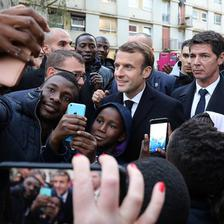

None
Caption:
"I have no idea what that means, to have a 'policy for the rich,' " Mr. Macron said in a combative speech on Tuesday in Tourcoing, in France's struggling north, outlining his long-awaited urban policy for the country.
True val
President Emmanuel Macron of France posed for pictures as he met residents of the Paris suburb Clichy-sous-Bois on Monday.



['President', 'Emmanuel', 'Macron', 'of', 'France', 'posed', 'for', 'pictures', 'as', 'he', 'met', 'residents', 'of', 'the', 'Paris', 'suburb', 'Clichy-sous-Bois', 'on', 'Monday.']
['"I', 'have', 'no', 'idea', 'what', 'that', 'means,', 'to', 'have', 'a', "'policy", 'for', 'the', "rich,'", '"', 'Mr.', 'Macron', 'said', 'in', 'a', 'combative', 'speech', 'on', 'Tuesday', 'in', 'Tourcoing,', 'in', "France's", 'struggling', 'north,', 'outlining', 'his', 'long-awaited', 'urban', 'policy', 'for', 'the', 'country.']
0.40276720463657734
0.6666666666666666


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


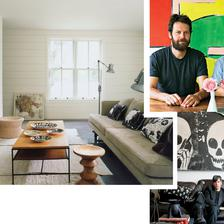

None
Caption:
Anyone who has ever renovated a house knows that construction invariably takes longer than expected.
True val

Open houses Clockwise from top left: the home of Tiina Laakkonen and Jon Rosen in Amagansett, N.Y.; Martino Gamper and Francis Upritchard in London; Bill Mullen in New York.





['Open', 'houses', 'Clockwise', 'from', 'top', 'left:', 'the', 'home', 'of', 'Tiina', 'Laakkonen', 'and', 'Jon', 'Rosen', 'in', 'Amagansett,', 'N.Y.;', 'Martino', 'Gamper', 'and', 'Francis', 'Upritchard', 'in', 'London;', 'Bill', 'Mullen', 'in', 'New', 'York.']
['Anyone', 'who', 'has', 'ever', 'renovated', 'a', 'house', 'knows', 'that', 'construction', 'invariably', 'takes', 'longer', 'than', 'expected.']
0.5081327481546147


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


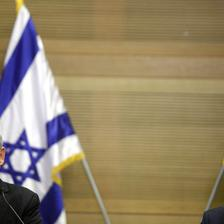

None
Caption:
"I think Prime Minister Netanyahu has been determined since he got elected to re-establish a very strong political center in Israel," said Dore Gold, president of the Jerusalem Center for Public Affairs and an adviser to Mr. Netanyahu during his first term as prime minister, in the 1990s.
True val

Prime Minister Benjamin Netanyahu, left, who leads the Likud Party, and Shaul Mofaz, the leader of the Kadima Party, at a news conference Tuesday in Jerusalem.





['Prime', 'Minister', 'Benjamin', 'Netanyahu,', 'left,', 'who', 'leads', 'the', 'Likud', 'Party,', 'and', 'Shaul', 'Mofaz,', 'the', 'leader', 'of', 'the', 'Kadima', 'Party,', 'at', 'a', 'news', 'conference', 'Tuesday', 'in', 'Jerusalem.']
['"I', 'think', 'Prime', 'Minister', 'Netanyahu', 'has', 'been', 'determined', 'since', 'he', 'got', 'elected', 'to', 're-establish', 'a', 'very', 'strong', 'political', 'center', 'in', 'Israel,"', 'said', 'Dore', 'Gold,', 'president', 'of', 'the', 'Jerusalem', 'Center', 'for', 'Pu

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


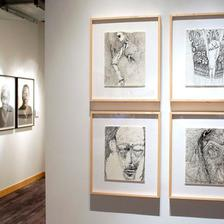

None
Caption:
Ms. Koczy's grandfather's jewelry shop, which she said was destroyed in the Kristallnacht -- the night in 1938 when Jewish homes, schools and businesses were ransacked -- was untouched by those events, according to Matthias Kordes, the lead archivist in Recklinghausen.
True val
Rosemarie Koczy’s artwork dealt with the Holocaust and its aftermath. She said she was sent to a concentration camp at age 3, but archivists have found documents that contradict her account.



['Rosemarie', 'Koczy’s', 'artwork', 'dealt', 'with', 'the', 'Holocaust', 'and', 'its', 'aftermath.', 'She', 'said', 'she', 'was', 'sent', 'to', 'a', 'concentration', 'camp', 'at', 'age', '3,', 'but', 'archivists', 'have', 'found', 'documents', 'that', 'contradict', 'her', 'account.']
['Ms.', "Koczy's", "grandfather's", 'jewelry', 'shop,', 'which', 'she', 'said', 'was', 'destroyed', 'in', 'the', 'Kristallnacht', '--', 'the', 'night', 'in', '1938', 'when', 'Jewish', 'homes,', 'schools', 'and', 'businesses', 'w

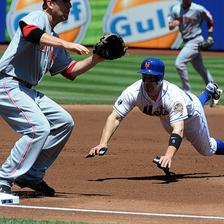

None
Caption:
He had not played since, although Collins has said he was available in an emergency.
True val

David Wright stealing third in the first inning as Todd Frazier covered the bag.





['David', 'Wright', 'stealing', 'third', 'in', 'the', 'first', 'inning', 'as', 'Todd', 'Frazier', 'covered', 'the', 'bag.']
['He', 'had', 'not', 'played', 'since,', 'although', 'Collins', 'has', 'said', 'he', 'was', 'available', 'in', 'an', 'emergency.']
0
0.0


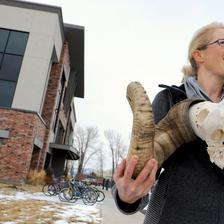

None
Caption:
Much about the diseases that originate in wildlife is a mystery.
True val

UNDERSTANDING  Raina K. Plowright, a disease ecologist, with the skull of a bighorn ram in Bozeman, Mont.





['UNDERSTANDING', 'Raina', 'K.', 'Plowright,', 'a', 'disease', 'ecologist,', 'with', 'the', 'skull', 'of', 'a', 'bighorn', 'ram', 'in', 'Bozeman,', 'Mont.']
['Much', 'about', 'the', 'diseases', 'that', 'originate', 'in', 'wildlife', 'is', 'a', 'mystery.']
0.5491004867761125


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


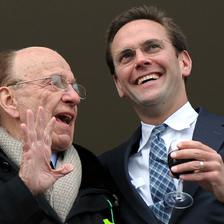

None
Caption:
Next week, and will appear before the in Parliament, offering another peek under unseemly blankets.
True val

Rupert Murdoch, the chief of News Corporation, and his son James, in 2010. Both have testified before a parliamentary panel.





['Rupert', 'Murdoch,', 'the', 'chief', 'of', 'News', 'Corporation,', 'and', 'his', 'son', 'James,', 'in', '2010.', 'Both', 'have', 'testified', 'before', 'a', 'parliamentary', 'panel.']
['Next', 'week,', 'and', 'will', 'appear', 'before', 'the', 'in', 'Parliament,', 'offering', 'another', 'peek', 'under', 'unseemly', 'blankets.']
0
1.0


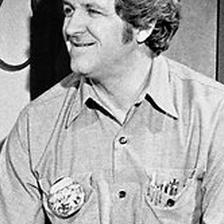

None
Caption:
He was 83.
True val

George Lindsey in 1985.





['George', 'Lindsey', 'in', '1985.']
['He', 'was', '83.']
0


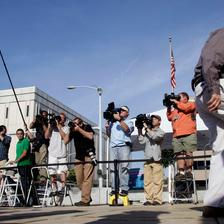

None
Caption:
Andrew Young?"
True val

John Edwards, left, arriving Thursday in Greensboro, N.C., for the final arguments in his corruption trial. The jury was to start deliberations on Friday.





['John', 'Edwards,', 'left,', 'arriving', 'Thursday', 'in', 'Greensboro,', 'N.C.,', 'for', 'the', 'final', 'arguments', 'in', 'his', 'corruption', 'trial.', 'The', 'jury', 'was', 'to', 'start', 'deliberations', 'on', 'Friday.']
['Andrew', 'Young?"']
0
0.0
0.21330048392599749
0.2757996632996633
0.5277777777777778
0.013888888888888888
0.041666666666666664
0.09722222222222222
0.013888888888888888
0.16666666666666666
0.1388888888888889
109


In [34]:
sum=0
sum2=0
no=0
no2=0
a0=0
a1=0
a2=0
a3=0
a4=0
a5=0
a7=0
for i in range(1500,1609):
  key=all_data[i]
  context_vec = output[i-1500]
  #print(context_vec.shape)
  m=-2
  cap_final=""
  for j in range(0,len(article_list_real[key])):
    npo = np.array(emd_im_name_article_list_tokenized[key]) 
    B = npo[j]
    cos_sim=cosine_similarity(context_vec.reshape(1,-1),B.reshape(1,-1))
    if cos_sim > m:
      m=cos_sim
      cap_final = article_list_real[key][j]
  img_path='/content/gdrive/MyDrive/Use Image/'+str(key)+'_'+str(img_cap_real[key]) +'.jpg'
  image = cv2.imread(img_path)
  print(cv2_imshow(image))
  print("Caption:")
  print(cap_final)
  print("True val")
  print(caption_real[key])
  print("\n\n")
  re = (caption_real[key])
  ca = (cap_final)
  reference=[]
  candidate=[]
  reference.append(re)
  candidate.append(ca)
  reference=reference[0].split()
  candidate=candidate[0].split()
  print(reference)
  print(candidate) 
  score = sentence_bleu(reference, candidate)
  sum+=score
  no+=1
  print(score)
  text=cap_final
  doc = nlp(text)
  matches=0
  maxlen=0
  for entity in doc.ents:
    if entity.label_!="DATE":
      maxlen=maxlen+1
      if entity.text.lower() in re.lower():
        matches=matches+1
  if maxlen!=0:
    print(matches/maxlen)
    sum2+=matches/maxlen
    no2+=1
    tem=matches/maxlen
    tem=tem*100.0
    if tem>=0 and tem<10:
      a0+=1
    elif tem>=10 and tem<20:
      a1+=1
    elif tem>=20 and tem<30:
      a2+=1
    elif tem>=30 and tem<40:
      a3+=1
    elif tem>=40 and tem<50:
      a4+=1
    elif tem>=50 and tem<70:
      a5+=1
    else:
      a7+=1
    
  

print(sum/no)
print(sum2/no2)
print(a0/no2)
print(a1/no2)
print(a2/no2)
print(a3/no2)
print(a4/no2)
print(a5/no2)
print(a7/no2)
print(no)



